In [ ]:
!pip install pyzipcode

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 18.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyzipcode: filename=pyzipcode-3.0.1-py3-none-any.whl size=1932161 sha256=0ae698bc0b63f1c5ccd1e842e0ca3536f0006549e4f480083dc5f880e767382a
  Stored in directory: /root/.cache/pip/wheels/33/11/bb/75313afc9ef5609e3997d374a6f6c4d48932fdb8ed8fe2ea77
Successfully built pyzipcode


In [ ]:
import pandas as pd
from pyzipcode import ZipCodeDatabase

# Initialize the ZipCodeDatabase
zcdb = ZipCodeDatabase()

def get_city_state(zip_code):
    try:
        zip_info = zcdb[zip_code]
        return zip_info.city, zip_info.state
    except KeyError:
        return None, None

def preprocess_data(users_df, movies_df, ratings_df):
    """
    Cleans and formats the user, movies, and ratings DataFrames.

    Parameters:
    - users_df (pd.DataFrame): DataFrame containing user information.
    - movies_df (pd.DataFrame): DataFrame containing movie information.
    - ratings_df (pd.DataFrame): DataFrame containing user ratings.

    Returns:
    - pd.DataFrame: A DataFrame that includes user info, liked and disliked movies, and their genres.
    """
    # Add city and state based on ZIP code
    users_df[['city', 'state']] = users_df['zip_code'].apply(lambda zip_code: pd.Series(get_city_state(zip_code)))

    # Ensure that the relevant columns are present and clean
    users_df.dropna(subset=['user_id', 'age', 'gender', 'occupation', 'city', 'state'], inplace=True)
    movies_df.dropna(subset=['movie_id', 'movie_title'], inplace=True)
    ratings_df.dropna(subset=['user_id', 'movie_id', 'rating', 'timestamp'], inplace=True)

    # Merge ratings with movie titles
    merged_df = ratings_df.merge(movies_df, on='movie_id')
    merged_df = merged_df.merge(users_df, on='user_id')
    # Convert timestamp to datetime if needed
    merged_df['timestamp'] = pd.to_datetime(merged_df['timestamp'])

    return merged_df[['user_id', 'zip_code', 'age', 'gender', 'occupation', 'city', 'state', 'movie_id', 'rating', 'timestamp', 'movie_title',
       'unknown', 'action',
       'adventure', 'animation', 'childrens', 'comedy', 'crime', 'documentary',
       'drama', 'fantasy', 'film_noir', 'horror', 'musical', 'mystery',
       'romance', 'sci_fi', 'thriller', 'war', 'western']]

# Example usage
# Assuming you have the DataFrames users_df, movies_df, and ratings_df as described.
# users_df = pd.read_csv('users.csv')  # Load your user DataFrame
# movies_df = pd.read_csv('movies.csv')  # Load your movie DataFrame
# ratings_df = pd.read_csv('ratings.csv')  # Load your ratings DataFrame

# cleaned_data = preprocess_data(users_df, movies_df, ratings_df)
# print(cleaned_data.head())


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
# from preprocess import clean_interactions, clean_items, clean_users  # Import preprocessing functions


def split_into_tasks(data, task_intervals=5):
    """
    Splits data into tasks based on time periods.

    :param data: Sorted DataFrame containing merged user-item interactions.
    :param task_intervals: Number of task splits based on temporal data distribution.
    :return: List of DataFrames, each representing a task.
    """
    tasks = []
    task_size = len(data) // task_intervals

    for i in range(task_intervals):
        start_idx = i * task_size
        end_idx = (i + 1) * task_size if i < task_intervals - 1 else len(data)
        task_data = data.iloc[start_idx:end_idx]
        tasks.append(task_data)

    return tasks


def create_train_val_test_splits(task_data):
    """
    Splits each task into train, validation, and test sets.

    :param task_data: DataFrame for a specific task.
    :return: train, val, test DataFrames for the task.
    """
    # Initial split: 60-40 for train/test
    train_data, test_data = train_test_split(task_data, test_size=0.4, shuffle=False)
    # Further split test_data into val and test (50-50 of 40% -> 20% each of original data)
    val_data, test_data = train_test_split(test_data, test_size=0.5, shuffle=False)

    return train_data, val_data, test_data


class MovieLensDataLoader:
    def __init__(self, interactions_path, item_path, user_path, rating_threshold=3.5, future_k=10):
        """
        Initializes the data loader.

        :param interactions_path: Path to the user interaction data file.
        :param item_path: Path to the item (movie) metadata file.
        :param user_path: Path to the user demographics file.
        :param rating_threshold: Rating threshold to consider a movie 'liked'.
        :param future_k: Number of future liked movies to predict in the label.
        """
        self.interactions_path = interactions_path
        self.item_path = item_path
        self.user_path = user_path
        self.rating_threshold = rating_threshold
        self.future_k = future_k

    def load_data(self):
        """Loads and merges the interaction, item, and user data."""
        # Load raw data
        interactions = pd.read_csv(self.interactions_path, sep='\t',
                                   names=['user_id', 'movie_id', 'rating', 'timestamp'],
                                   parse_dates=['timestamp'],
                                   date_parser=lambda x: pd.to_datetime(int(x), unit='s'))
        items = pd.read_csv(self.item_path, sep='|', encoding='latin-1',
                            names=['movie_id', 'movie_title', 'release_date', 'video_release_date',
                                   'imdb_url', 'unknown', 'action',
                                   'adventure', 'animation', 'childrens', 'comedy', 'crime', 'documentary',
                                   'drama', 'fantasy',
                                   'film_noir', 'horror', 'musical', 'mystery', 'romance', 'sci_fi',
                                   'thriller', 'war', 'western'])
        users = pd.read_csv(self.user_path, sep='|', names=['user_id', 'age', 'gender', 'occupation', 'zip_code'])

        # Merge cleaned data
        data = preprocess_data(
            users_df=users,
            movies_df=items,
            ratings_df=interactions
        )
        data = data.sort_values(by='timestamp')  # Sort by timestamp for temporal splitting

        return data

    def generate_labels(self, data):
        """
        Generate future liked movies as labels for each user.

        :param data: DataFrame containing user interactions.
        :return: DataFrame with a new 'future_liked_movies' column containing the next k movies for each user.
        """
        data['liked'] = data['rating'] >= self.rating_threshold
        user_future_likes = {}

        # Iterate by user to generate labels
        for user, group in data.groupby('user_id'):
            liked_movies = group[group['liked']]['movie_id'].tolist()
            future_liked = [liked_movies[i:i + self.future_k] for i in range(len(liked_movies) - self.future_k)]
            user_future_likes[user] = future_liked

        data['future_liked_movies'] = data['user_id'].map(user_future_likes)

        return data

    def prepare_data(self, task_intervals=5):
        """
        Prepares data by loading, creating tasks, and generating labels.

        :param task_intervals: Number of task intervals for splitting data into tasks.
        :return: List of dictionaries with train, val, test splits for each task.
        """
        data = self.load_data()
        tasks = split_into_tasks(data, task_intervals)
        all_splits = []

        for task_data in tasks:
            train, val, test = create_train_val_test_splits(task_data)
            # Generate labels for each split (train, val, test)
            train = self.generate_labels(train)
            val = self.generate_labels(val)
            test = self.generate_labels(test)
            all_splits.append({'train': train, 'val': val, 'test': test})

        return all_splits



In [ ]:
!unzip ml-100k.zip

Archive:  ml-100k.zip
   creating: ml-100k/
  inflating: ml-100k/allbut.pl       
  inflating: ml-100k/mku.sh          
  inflating: ml-100k/README          
  inflating: ml-100k/u.data          
  inflating: ml-100k/u.genre         
  inflating: ml-100k/u.info          
  inflating: ml-100k/u.item          
  inflating: ml-100k/u.occupation    
  inflating: ml-100k/u.user          
  inflating: ml-100k/u1.base         
  inflating: ml-100k/u1.test         
  inflating: ml-100k/u2.base         
  inflating: ml-100k/u2.test         
  inflating: ml-100k/u3.base         
  inflating: ml-100k/u3.test         
  inflating: ml-100k/u4.base         
  inflating: ml-100k/u4.test         
  inflating: ml-100k/u5.base         
  inflating: ml-100k/u5.test         
  inflating: ml-100k/ua.base         
  inflating: ml-100k/ua.test         
  inflating: ml-100k/ub.base         
  inflating: ml-100k/ub.test         


In [ ]:
# Define the paths to your MovieLens dataset files
interactions_path = './ml-100k/u.data'
items_path = './ml-100k/u.item'
users_path = './ml-100k/u.user'

# Initialize the data loader
data_loader = MovieLensDataLoader(interactions_path, items_path, users_path)

# Load the data
data = data_loader.load_data()

# Print some sample data
print("Sample data:")
print(data.head())  # Display the first few rows of the merged data

<ipython-input-66-6f07f51a3ced>:61: FutureWarning: The argument 'date_parser' is deprecated and will be removed in a future version. Please use 'date_format' instead, or read your data in as 'object' dtype and then call 'to_datetime'.
  interactions = pd.read_csv(self.interactions_path, sep='\t',


Sample data:
       user_id zip_code  age gender occupation          city state  movie_id  \
208        259    48823   21      M    student  East Lansing    MI       255   
81279      259    48823   21      M    student  East Lansing    MI       286   
42042      259    48823   21      M    student  East Lansing    MI       298   
20868      259    48823   21      M    student  East Lansing    MI       185   
80032      259    48823   21      M    student  East Lansing    MI       173   

       rating           timestamp  ... fantasy  film_noir  horror  musical  \
208         4 1997-09-20 03:05:10  ...       0          0       0        0   
81279       4 1997-09-20 03:05:27  ...       0          0       0        0   
42042       4 1997-09-20 03:05:54  ...       0          0       0        0   
20868       4 1997-09-20 03:06:21  ...       0          0       1        0   
80032       4 1997-09-20 03:07:23  ...       0          0       0        0   

       mystery  romance  sci_fi  thri

In [ ]:
data.head()

,user_id,zip_code,age,gender,occupation,city,state,movie_id,rating,timestamp,...,fantasy,film_noir,horror,musical,mystery,romance,sci_fi,thriller,war,western
208,259,48823,21,M,student,East Lansing,MI,255,4,1997-09-20 03:05:10,...,0,0,0,0,0,1,0,0,0,0
81279,259,48823,21,M,student,East Lansing,MI,286,4,1997-09-20 03:05:27,...,0,0,0,0,0,1,0,0,1,0
42042,259,48823,21,M,student,East Lansing,MI,298,4,1997-09-20 03:05:54,...,0,0,0,0,0,0,1,1,0,0
20868,259,48823,21,M,student,East Lansing,MI,185,4,1997-09-20 03:06:21,...,0,0,1,0,0,1,0,1,0,0
80032,259,48823,21,M,student,East Lansing,MI,173,4,1997-09-20 03:07:23,...,0,0,0,0,0,1,0,0,0,0


In [ ]:
data.columns

Index(['user_id', 'zip_code', 'age', 'gender', 'occupation', 'city', 'state',
       'movie_id', 'rating', 'timestamp', 'movie_title', 'unknown', 'action',
       'adventure', 'animation', 'childrens', 'comedy', 'crime', 'documentary',
       'drama', 'fantasy', 'film_noir', 'horror', 'musical', 'mystery',
       'romance', 'sci_fi', 'thriller', 'war', 'western'],
      dtype='object')

In [ ]:
data[data['user_id']==259]

,user_id,movie_id,rating,timestamp,movie_title,unknown,action,adventure,animation,childrens,...,fantasy,film_noir,horror,musical,mystery,romance,sci_fi,thriller,war,western
214,259,255,4,1997-09-20 03:05:10,My Best Friend's Wedding (1997),0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
83965,259,286,4,1997-09-20 03:05:27,"English Patient, The (1996)",0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
43027,259,298,4,1997-09-20 03:05:54,Face/Off (1997),0,1,0,0,0,...,0,0,0,0,0,0,1,1,0,0
21396,259,185,4,1997-09-20 03:06:21,Psycho (1960),0,0,0,0,0,...,0,0,1,0,0,1,0,1,0,0
82655,259,173,4,1997-09-20 03:07:23,"Princess Bride, The (1987)",0,1,1,0,0,...,0,0,0,0,0,1,0,0,0,0
10891,259,108,4,1997-09-20 03:08:02,Kids in the Hall: Brain Candy (1996),0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1766,259,772,4,1997-09-20 03:08:02,Kids (1995),0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
26399,259,288,3,1997-09-20 03:08:25,Scream (1996),0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
85297,259,928,4,1997-09-20 03:08:57,"Craft, The (1996)",0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
159,259,117,4,1997-09-20 03:09:48,"Rock, The (1996)",0,1,1,0,0,...,0,0,0,0,0,0,0,1,0,0


In [ ]:
# prompt: count average no of interactions per user in the dataset

average_interactions_per_user = data.groupby('user_id')['movie_id'].count().mean()
print(f"Average number of interactions per user: {average_interactions_per_user}")

Average number of interactions per user: 106.04453870625663


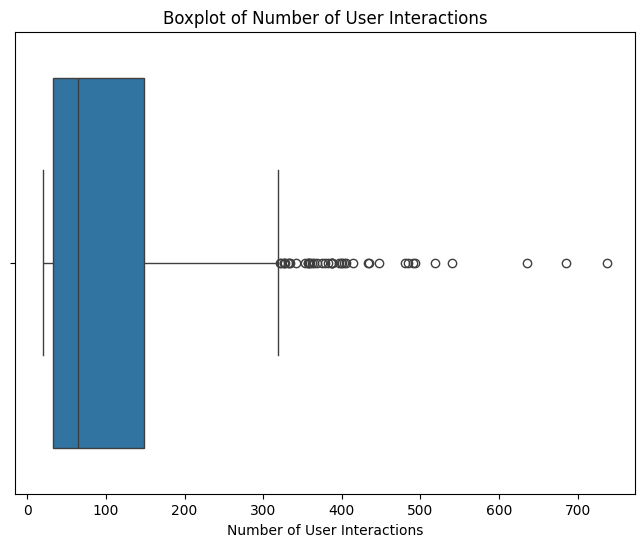

In [ ]:
# prompt: Boxplot of no of user interactions

import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'data' is your DataFrame from the previous code
user_interactions = data.groupby('user_id')['movie_id'].count()

# Create a boxplot
plt.figure(figsize=(8, 6))
sns.boxplot(x=user_interactions)
plt.xlabel('Number of User Interactions')
plt.title('Boxplot of Number of User Interactions')
plt.show()

In [ ]:
# prompt: What are the top 10 least no of user interactions

# Assuming 'data' is your DataFrame from the previous code
user_interactions = data.groupby('user_id')['movie_id'].count()

# Find the top 10 users with the least number of interactions
top_10_least_interactions = user_interactions.nsmallest(100)

print("Top 10 users with the least number of interactions:")
top_10_least_interactions

Top 10 users with the least number of interactions:


,movie_id
user_id,
19,20
34,20
36,20
93,20
143,20
...,...
765,23
808,23
849,23


In [ ]:
# prompt: Give me a distribution of the interaction counts per user - similar to a describe function that can get me the min, max, mean, etc

# Assuming 'data' is your DataFrame from the previous code
user_interaction_counts = data.groupby('user_id')['movie_id'].count()

# Calculate the distribution statistics
interaction_stats = user_interaction_counts.describe()

print("Distribution of Interaction Counts per User:")
interaction_stats

Distribution of Interaction Counts per User:


,movie_id
count,943.000000
mean,106.044539
std,100.931743
min,20.000000
25%,33.000000
50%,65.000000
75%,148.000000
max,737.000000


In [ ]:
# Assuming 'data' is your DataFrame from the previous code
user_interaction_counts = data.groupby('user_id')['movie_id'].count()

# Calculate the distribution statistics
interaction_stats = user_interaction_counts.describe()

# Extract the quartiles
interaction_stats_quartiles = {
    'q1': interaction_stats['25%'],
    'q2': interaction_stats['50%'],
    'q3': interaction_stats['75%']
}

interaction_stats_quartiles

{'q1': 33.0, 'q2': 65.0, 'q3': 148.0}

In [ ]:
# # prompt: Count the number of interactions in each quartile

# # Assuming 'user_interaction_counts' is the Series containing the number of interactions per user
# # (as calculated in the previous code)

# def count_interactions_in_quartiles(user_interaction_counts):
#   """
#   Counts the number of interactions in each quartile.

#   Args:
#       user_interaction_counts: A pandas Series containing the number of interactions per user.

#   Returns:
#       A dictionary mapping quartile names (Q1, Q2, Q3, Q4) to the number of users within that quartile.
#   """

#   quartile_counts = {}

#   # Calculate quartiles
#   q1 = user_interaction_counts.quantile(0.25)
#   q2 = user_interaction_counts.quantile(0.50)
#   q3 = user_interaction_counts.quantile(0.75)

#   # Count users in each quartile
#   quartile_counts['Q1'] = ((user_interaction_counts >= 0) & (user_interaction_counts < q1)).sum()
#   quartile_counts['Q2'] = ((user_interaction_counts >= q1) & (user_interaction_counts < q2)).sum()
#   quartile_counts['Q3'] = ((user_interaction_counts >= q2) & (user_interaction_counts < q3)).sum()
#   quartile_counts['Q4'] = (user_interaction_counts >= q3).sum()

#   return quartile_counts

# # Example usage:
# quartile_interaction_counts = count_interactions_in_quartiles(user_interaction_counts)

# print("Number of users in each quartile:")
# quartile_interaction_counts


In [ ]:
# tasks = split_into_tasks(data=data, task_intervals=5)

In [ ]:
# for i, task_data in enumerate(tasks):
#   unique_users = task_data['user_id'].nunique()
#   print(f"Task {i+1}: Number of unique users = {unique_users}")

In [ ]:
#

In [ ]:
# def calculate_aggregations(X_data):
#     """
#     Calculate aggregated features for user-movie interactions for `X`.

#     Parameters:
#     - X_data (pd.DataFrame): DataFrame with user-movie interactions for aggregation.

#     Returns:
#     - dict: Aggregated features including average rating, genre counts, and last k movies watched.
#     """
#     avg_rating = X_data['rating'].mean()

#     # Calculate genre counts
#     genre_columns = [
#         'unknown', 'action', 'adventure', 'animation', 'childrens', 'comedy', 'crime', 'documentary',
#         'drama', 'fantasy', 'film_noir', 'horror', 'musical', 'mystery', 'romance', 'sci_fi', 'thriller',
#         'war', 'western'
#     ]
#     genre_counts = X_data[genre_columns].sum().to_dict()

#     # Last `k` movies watched (movie IDs)
#     last_k_movies = X_data['movie_id'].tolist()

#     return {
#         'avg_rating': avg_rating,
#         'genre_counts': genre_counts,
#         # 'last_k_movies': last_k_movies
#     }

# def split_data_into_tasks(user_data, k=5, rating_threshold=4):
#     """
#     Splits user interactions into tasks based on interaction count quartiles and prepares `X` and `Y` data.

#     Parameters:
#     - user_data (pd.DataFrame): DataFrame of user interactions, sorted by timestamp.
#     - k (int): Number of recent movies for `Y` labels in each task.
#     - rating_threshold (int): Rating threshold above which movies are marked as liked (Y=1).

#     Returns:
#     - dict: Contains four tasks with `X` and `Y` ready for model input.
#     """
#     # Calculate interaction count distribution quartiles
#     user_interaction_counts = user_data.groupby('user_id')['movie_id'].count()
#     interaction_stats = user_interaction_counts.describe()
#     quartiles = {
#         'q1': interaction_stats['25%'],
#         'q2': interaction_stats['50%'],
#         'q3': interaction_stats['75%']
#     }

#     tasks = {1: [], 2: [], 3: [], 4: []}

#     # Process each user to create task-based splits
#     for user_id, user_df in user_data.groupby("user_id"):
#         user_df = user_df.sort_values("timestamp").reset_index(drop=True)
#         num_interactions = len(user_df)

#         # Determine the user's maximum task based on interaction count quartiles
#         if num_interactions < quartiles['q1']:
#             max_task = 1
#         elif num_interactions < quartiles['q2']:
#             max_task = 2
#         elif num_interactions < quartiles['q3']:
#             max_task = 3
#         else:
#             max_task = 4

#         # For each task, accumulate previous data for better aggregations
#         for task_id in range(1, max_task + 1):
#             # Define the task range based on task level
#             task_cutoff_idx = min(num_interactions, int(num_interactions * (task_id / max_task)))

#             task_data = user_df.iloc[:task_cutoff_idx]  # Task data includes all previous task data
#             if len(task_data) < k:
#                 continue  # Skip tasks where there aren't enough interactions for `Y`

#             # Define `X` from first `N - k` interactions
#             X_data = task_data.iloc[:-k]

#             # Aggregate features for `X` using the helper function
#             X_features = calculate_aggregations(X_data)
#             X_features['user_id'] = user_id  # Add user_id to the feature dictionary

#             # Define `Y` from the last `k` interactions
#             Y_data = task_data.iloc[-k:]
#             Y_labels = (Y_data['rating'] >= rating_threshold).astype(int).tolist()

#             # Append this task's `X` and `Y` to the task dictionary
#             tasks[task_id].append({
#                 'X': X_features,
#                 'Y': Y_labels
#             })

#     return tasks

In [ ]:
# task_data_splits = split_data_into_tasks(data, k=5, rating_threshold=4)

In [ ]:
# type(task_data_splits)

In [ ]:
# task_data_splits.keys()

In [ ]:
# task_data_splits[1]

In [ ]:
# data['movie_id'].nunique()

In [ ]:
# task_data_splits[1][0]['X_train']

In [ ]:
import pandas as pd

def calculate_aggregations(X_data, recent_k_data, user_profile):
    """
    Calculate aggregated features for user-movie interactions for `X`.

    Parameters:
    - X_data (pd.DataFrame): DataFrame with all past user-movie interactions for aggregation (global).
    - recent_k_data (pd.DataFrame): DataFrame with recent `k` user-movie interactions (recent preferences).
    - user_profile (dict): Dictionary containing user profile features.

    Returns:
    - dict: Aggregated features including average rating, genre counts, rating trend, and genre diversity, along with user profile.
    """
    # Global aggregations across all past interactions
    avg_rating = X_data['rating'].mean()
    total_watch_count = len(X_data)
    high_rating_proportion = (X_data['rating'] >= 4).mean()

    # Calculate rating trend as change in average rating across last 3 interactions, if available
    if len(X_data) >= 3:
        recent_ratings = X_data['rating'].iloc[-3:]
        rating_trend = recent_ratings.pct_change().mean()  # Average percentage change
    else:
        rating_trend = 0  # Default if insufficient data

    # Genre-based aggregations
    genre_columns = [
        'unknown', 'action', 'adventure', 'animation', 'childrens', 'comedy', 'crime', 'documentary',
        'drama', 'fantasy', 'film_noir', 'horror', 'musical', 'mystery', 'romance', 'sci_fi', 'thriller',
        'war', 'western'
    ]

    # Global genre counts and favorite genre
    genre_counts = X_data[genre_columns].sum().to_dict()
    favorite_genre = max(genre_counts, key=genre_counts.get)
    genre_diversity = len([g for g in genre_counts.values() if g > 0]) / len(genre_columns)

    # Recent genre counts (based on recent_k_data)
    recent_genre_counts = recent_k_data[genre_columns].sum().to_dict()

    # Include user profile features
    aggregated_data = {
        'avg_rating': avg_rating,
        'total_watch_count': total_watch_count,
        'high_rating_proportion': high_rating_proportion,
        'rating_trend': rating_trend,
        'genre_counts': genre_counts,
        'favorite_genre': favorite_genre,
        'genre_diversity': genre_diversity,
        'recent_genre_counts': recent_genre_counts
    }

    # Add user profile features
    aggregated_data.update(user_profile)

    return aggregated_data


def split_data_into_tasks(user_data, k=5, rating_threshold=4):
    """
    Splits user interactions into tasks based on interaction count quartiles and prepares `X` and `Y` data.

    Parameters:
    - user_data (pd.DataFrame): DataFrame of user interactions, sorted by timestamp.
    - k (int): Number of recent movies for `Y` labels in each task.
    - rating_threshold (int): Rating threshold above which movies are marked as liked (Y=1).

    Returns:
    - dict: Contains four tasks with `X` and `Y` ready for model input.
    """
    # Calculate interaction count distribution quartiles
    user_interaction_counts = user_data.groupby('user_id')['movie_id'].count()
    interaction_stats = user_interaction_counts.describe()
    quartiles = {
        'q1': interaction_stats['25%'],
        'q2': interaction_stats['50%'],
        'q3': interaction_stats['75%']
    }

    tasks = {1: [], 2: [], 3: [], 4: []}

    # Process each user to create task-based splits
    for user_id, user_df in user_data.groupby("user_id"):
        user_df = user_df.sort_values("timestamp").reset_index(drop=True)
        num_interactions = len(user_df)

         # Extract user profile information
        user_profile = user_df.iloc[0][['age', 'gender', 'occupation', 'zip_code', 'city', 'state']].to_dict()


        # Determine the user's maximum task based on interaction count quartiles
        if num_interactions < quartiles['q1']:
            max_task = 1
        elif num_interactions < quartiles['q2']:
            max_task = 2
        elif num_interactions < quartiles['q3']:
            max_task = 3
        else:
            max_task = 4

        # For each task, accumulate previous data for better aggregations
        accumulated_data = pd.DataFrame()  # Keeps track of all previous interactions
        for task_id in range(1, max_task + 1):
            # Define the task range based on task level
            task_cutoff_idx = min(num_interactions, int(num_interactions * (task_id / max_task)))
            task_data = user_df.iloc[:task_cutoff_idx]  # Task data includes all previous task data

            if len(task_data) < k:
                continue  # Skip tasks where there aren’t enough interactions for `Y`

            # Define `X` from all accumulated interactions except the last `k`
            X_data = task_data.iloc[:-k]
            accumulated_data = pd.concat([accumulated_data, X_data])  # Append to accumulated data

            # Define `Y` from the last `k` interactions
            Y_data = task_data.iloc[-k:]
            Y_labels = Y_data.loc[Y_data['rating'] >= rating_threshold, 'movie_id'].tolist()

            # Aggregated features for `X` using the helper function (both global and recent)
            X_features = calculate_aggregations(accumulated_data, X_data.iloc[-k:], user_profile)
            X_features['user_id'] = user_id  # Add user_id to the feature dictionary

            # Append this task's `X` and `Y` to the task dictionary
            tasks[task_id].append({
                'X': X_features,
                'Y': Y_labels
            })

    return tasks

# Example Usage

# Generate task-wise splits
task_data_splits = split_data_into_tasks(data, k=10, rating_threshold=4)


In [ ]:
task_data_splits[1]

[{'X': {'avg_rating': 4.051724137931035,
   'total_watch_count': 58,
   'high_rating_proportion': 0.7586206896551724,
   'rating_trend': 0.55,
   'genre_counts': {'unknown': 0,
    'action': 17,
    'adventure': 7,
    'animation': 3,
    'childrens': 1,
    'comedy': 18,
    'crime': 8,
    'documentary': 0,
    'drama': 29,
    'fantasy': 0,
    'film_noir': 0,
    'horror': 2,
    'musical': 0,
    'mystery': 2,
    'romance': 8,
    'sci_fi': 13,
    'thriller': 10,
    'war': 10,
    'western': 0},
   'favorite_genre': 'drama',
   'genre_diversity': 0.6842105263157895,
   'recent_genre_counts': {'unknown': 0,
    'action': 3,
    'adventure': 0,
    'animation': 1,
    'childrens': 0,
    'comedy': 2,
    'crime': 2,
    'documentary': 0,
    'drama': 4,
    'fantasy': 0,
    'film_noir': 0,
    'horror': 1,
    'musical': 0,
    'mystery': 0,
    'romance': 1,
    'sci_fi': 2,
    'thriller': 4,
    'war': 3,
    'western': 0},
   'age': 24,
   'gender': 'M',
   'occupation': 'te

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

def prepare_task_dfs(tasks):
    task_dfs = []

    for task in tasks.values():
        # Extract X and Y data for each user-task pair
        X_data = []
        Y_data = []

        for entry in task:
            X_data.append(entry['X'])
            Y_data.append(entry['Y'])

        # Convert X_data to DataFrame
        X_df = pd.DataFrame(X_data)

        # Convert Y_data into DataFrame by expanding movie IDs
        Y_df = pd.DataFrame(Y_data, columns=[f'movie_id_{i+1}' for i in range(max(len(y) for y in Y_data))])

        # Concatenate X and Y to form the final DataFrame for this task
        task_df = pd.concat([X_df, Y_df], axis=1)
        task_dfs.append(task_df)

    return task_dfs

def split_train_val_test(task_df, test_size=0.2, val_size=0.25, random_state=42):
    # First split to separate out the test set
    train_val, test = train_test_split(task_df, test_size=test_size, random_state=random_state)
    # Then split the remaining data into train and validation sets
    train, val = train_test_split(train_val, test_size=val_size, random_state=random_state)

    return train, val, test

# Usage example
tasks_dfs = prepare_task_dfs(task_data_splits)  # Convert tasks into DataFrames

# Split each task DataFrame into train, val, and test
splits = [split_train_val_test(task_df) for task_df in tasks_dfs]

# Access train, val, and test for each task
for i, (train, val, test) in enumerate(splits):
    print(f"Task {i+1} - Train Shape: {train.shape}, Validation Shape: {val.shape}, Test Shape: {test.shape}")


Task 1 - Train Shape: (546, 25), Validation Shape: (182, 25), Test Shape: (183, 25)
Task 2 - Train Shape: (412, 25), Validation Shape: (138, 25), Test Shape: (138, 25)
Task 3 - Train Shape: (275, 25), Validation Shape: (92, 25), Test Shape: (92, 25)
Task 4 - Train Shape: (138, 25), Validation Shape: (46, 25), Test Shape: (46, 25)


In [ ]:
df = (splits[0][0])
df.dtypes

,0
avg_rating,float64
total_watch_count,int64
high_rating_proportion,float64
rating_trend,float64
genre_counts,object
favorite_genre,object
genre_diversity,float64
recent_genre_counts,object
age,int64
gender,object


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

def flatten_dict_columns(df, column_names):
    """
    Flattens dictionary columns in a DataFrame by expanding each key-value pair
    into separate columns.

    Parameters:
    - df (pd.DataFrame): The DataFrame with columns containing dictionaries.
    - column_names (list): List of column names with dictionary values to flatten.

    Returns:
    - pd.DataFrame: DataFrame with the dictionary columns expanded.
    """
    for column in column_names:
        dict_df = pd.json_normalize(df[column])
        dict_df.columns = [f"{column}_{subcol}" for subcol in dict_df.columns]
        df = pd.concat([df.drop(columns=[column]), dict_df], axis=1)
    return df

def prepare_task_dfs(tasks):
    task_dfs = []

    for task in tasks.values():
        # Extract X and Y data for each user-task pair
        X_data = []
        Y_data = []

        for entry in task:
            X_data.append(entry['X'])
            Y_data.append(entry['Y'])  # Keep Y as list of movie IDs

        # Convert X_data to DataFrame
        X_df = pd.DataFrame(X_data)

        # Flatten 'genre_counts' and 'recent_genre_counts' columns
        X_df = flatten_dict_columns(X_df, ['genre_counts', 'recent_genre_counts'])

        # Convert Y_data to a Series, storing each list of movie IDs in a single cell
        Y_df = pd.Series(Y_data, name="Y")

        # Concatenate X and Y to form the final DataFrame for this task
        task_df = pd.concat([X_df, Y_df], axis=1)
        task_dfs.append(task_df)

    return task_dfs

def split_train_val_test(task_df, test_size=0.2, val_size=0.25, random_state=42):
    # First split to separate out the test set
    train_val, test = train_test_split(task_df, test_size=test_size, random_state=random_state)
    # Then split the remaining data into train and validation sets
    train, val = train_test_split(train_val, test_size=val_size, random_state=random_state)

    return train, val, test

# Usage example
tasks_dfs = prepare_task_dfs(task_data_splits)  # Convert tasks into DataFrames

# Split each task DataFrame into train, val, and test
splits = [split_train_val_test(task_df) for task_df in tasks_dfs]

# Access train, val, and test for each task
for i, (train, val, test) in enumerate(splits):
    print(f"Task {i+1} - Train Shape: {train.shape}, Validation Shape: {val.shape}, Test Shape: {test.shape}")


Task 1 - Train Shape: (546, 52), Validation Shape: (182, 52), Test Shape: (183, 52)
Task 2 - Train Shape: (412, 52), Validation Shape: (138, 52), Test Shape: (138, 52)
Task 3 - Train Shape: (275, 52), Validation Shape: (92, 52), Test Shape: (92, 52)
Task 4 - Train Shape: (138, 52), Validation Shape: (46, 52), Test Shape: (46, 52)


In [ ]:
splits[0][0].head()

,avg_rating,total_watch_count,high_rating_proportion,rating_trend,favorite_genre,genre_diversity,age,gender,occupation,zip_code,...,recent_genre_counts_film_noir,recent_genre_counts_horror,recent_genre_counts_musical,recent_genre_counts_mystery,recent_genre_counts_romance,recent_genre_counts_sci_fi,recent_genre_counts_thriller,recent_genre_counts_war,recent_genre_counts_western,Y
124,3.150000,20,0.350000,0.450000,drama,0.684211,36,F,marketing,07039,...,0,1,0,2,3,0,3,1,0,[]
632,3.857143,14,0.714286,-0.175000,action,0.631579,20,M,student,39762,...,0,0,0,1,3,3,2,2,0,"[117, 24, 257, 1016, 252, 254]"
377,3.666667,66,0.590909,0.166667,drama,0.894737,33,M,entertainment,37412,...,0,0,1,0,1,1,3,4,0,"[96, 844, 603]"
222,3.090909,11,0.272727,-0.125000,action,0.631579,48,M,librarian,01080,...,0,0,0,1,3,1,1,1,0,"[50, 126, 252, 300, 289, 471, 181, 924, 748, 846]"
330,4.166667,12,0.916667,0.000000,action,0.684211,46,M,engineer,80123,...,0,0,2,0,3,4,1,2,1,"[66, 196, 378, 71, 402, 497, 1, 199, 186, 486]"


In [ ]:
splits[0][0].dtypes

,0
avg_rating,float64
total_watch_count,int64
high_rating_proportion,float64
rating_trend,float64
favorite_genre,object
genre_diversity,float64
age,int64
gender,object
occupation,object
zip_code,object


In [ ]:
splits[0][0]['Y']

,Y
124,[]
632,"[117, 24, 257, 1016, 252, 254]"
377,"[96, 844, 603]"
222,"[50, 126, 252, 300, 289, 471, 181, 924, 748, 846]"
330,"[66, 196, 378, 71, 402, 497, 1, 199, 186, 486]"
...,...
531,"[1099, 192, 183, 466, 462, 23]"
811,"[718, 7, 713, 275, 24, 596, 455, 249]"
75,"[283, 275, 285, 100, 116]"
403,"[271, 289, 270, 936, 297, 283]"


In [ ]:
import os

def save_splits_to_csv(splits, base_dir="task_splits"):
    """
    Saves train, validation, and test splits for each task to CSV files.

    Parameters:
    - splits (list of tuples): Each element is a tuple (train, val, test) for a task.
    - base_dir (str): Directory to save the task CSVs.
    """
    # Create the base directory if it doesn't exist
    os.makedirs(base_dir, exist_ok=True)

    # Loop through each task's split
    for i, (train, val, test) in enumerate(splits, start=1):
        task_dir = os.path.join(base_dir, f"task_{i}")
        os.makedirs(task_dir, exist_ok=True)  # Create directory for each task

        # Save each split to a CSV file
        train.to_csv(os.path.join(task_dir, f"task_{i}_train.csv"), index=False)
        val.to_csv(os.path.join(task_dir, f"task_{i}_val.csv"), index=False)
        test.to_csv(os.path.join(task_dir, f"task_{i}_test.csv"), index=False)

        print(f"Task {i} splits saved: Train, Validation, and Test.")

# Usage example
save_splits_to_csv(splits)


Task 1 splits saved: Train, Validation, and Test.
Task 2 splits saved: Train, Validation, and Test.
Task 3 splits saved: Train, Validation, and Test.
Task 4 splits saved: Train, Validation, and Test.


In [ ]:
!zip -r task_splits.zip task_splits

  adding: task_splits/ (stored 0%)
  adding: task_splits/task_3/ (stored 0%)
  adding: task_splits/task_3/task_3_train.csv (deflated 64%)
  adding: task_splits/task_3/task_3_test.csv (deflated 61%)
  adding: task_splits/task_3/task_3_val.csv (deflated 62%)
  adding: task_splits/task_1/ (stored 0%)
  adding: task_splits/task_1/task_1_val.csv (deflated 68%)
  adding: task_splits/task_1/task_1_train.csv (deflated 71%)
  adding: task_splits/task_1/task_1_test.csv (deflated 69%)
  adding: task_splits/task_2/ (stored 0%)
  adding: task_splits/task_2/task_2_train.csv (deflated 66%)
  adding: task_splits/task_2/task_2_val.csv (deflated 64%)
  adding: task_splits/task_2/task_2_test.csv (deflated 65%)
  adding: task_splits/task_4/ (stored 0%)
  adding: task_splits/task_4/task_4_test.csv (deflated 59%)
  adding: task_splits/task_4/task_4_train.csv (deflated 61%)
  adding: task_splits/task_4/task_4_val.csv (deflated 59%)


In [ ]:
data.dtypes

,0
user_id,int64
zip_code,object
age,int64
gender,object
occupation,object
city,object
state,object
movie_id,int64
rating,int64
timestamp,datetime64[ns]


In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

def scale_numerical_features(df, scaler_type="standard"):
    """
    Scales numerical columns in the DataFrame.

    Parameters:
    - df (pd.DataFrame): DataFrame containing the features.
    - scaler_type (str): Type of scaler to use; options are "standard" or "minmax".

    Returns:
    - df_scaled (pd.DataFrame): DataFrame with scaled numerical features.
    """
    df_scaled = df.copy()
    numerical_cols = ['age', 'avg_rating', 'total_watch_count', 'high_rating_proportion', 'rating_trend', 'genre_diversity']

    # Select the scaler based on the scaler_type parameter
    if scaler_type == "standard":
        scaler = StandardScaler()
    elif scaler_type == "minmax":
        scaler = MinMaxScaler()
    else:
        raise ValueError("Invalid scaler_type. Choose 'standard' or 'minmax'.")

    # Fit and transform the numerical features
    df_scaled[numerical_cols] = scaler.fit_transform(df[numerical_cols])

    return df_scaled


In [ ]:
from sklearn.preprocessing import OneHotEncoder
import pandas as pd

def encode_categorical_features(df):
    """
    Encodes categorical columns in the DataFrame.

    Parameters:
    - df (pd.DataFrame): DataFrame with categorical features to encode.

    Returns:
    - df_encoded (pd.DataFrame): DataFrame with encoded categorical features.
    """
    df_encoded = df.copy()

    # One-hot encode categorical columns
    categorical_cols = ['favorite_genre', 'gender', 'occupation', 'city', 'state']
    # df_encoded = pd.get_dummies(df_encoded, columns=categorical_cols, drop_first=True)
    df_encoded = df_encoded.drop(columns=categorical_cols, errors='ignore')

    return df_encoded


In [ ]:
# import numpy as np

# def encode_y_as_multihot(y_data, num_movies=1682):
#     """
#     Encodes Y data (list of movie IDs) as multi-hot encoded vectors.

#     Parameters:
#     - y_data (list of lists): Each sublist contains movie IDs that are the target for a user-task.
#     - num_movies (int): Total number of unique movies in the dataset.

#     Returns:
#     - y_encoded (np.array): Array with multi-hot encoding for each user-task.
#     """
#     try:
#       if type(y_data) == 'str':
#           y_data = eval(y_data)
#     except:
#           print(y_data, type(y_data))

#     y_encoded = np.zeros((len(y_data), num_movies))
#     for idx, movie_ids in enumerate(y_data):
#         for movie_id in movie_ids:
#           try:
#             y_encoded[idx, movie_id - 1] = 1  # Assuming movie IDs are 1-indexed
#           except:
#             print(movie_id)

#     return y_encoded

import numpy as np
import pandas as pd

def encode_y_as_multihot(y_data, num_movies=1682):
    """
    Encodes Y data (Series of lists of movie IDs) as multi-hot encoded vectors.

    Parameters:
    - y_data (pd.Series): Series where each entry is a list of movie IDs that are the target for a user-task.
    - num_movies (int): Total number of unique movies in the dataset.

    Returns:
    - y_encoded (np.array): Array with multi-hot encoding for each user-task.
    """
    y_encoded = np.zeros((len(y_data), num_movies), dtype=int)

    for idx, movie_ids in enumerate(y_data):
        # Ensure each element is a list of integers
        if isinstance(movie_ids, str):
            try:
                movie_ids = eval(movie_ids)
            except:
                raise ValueError(f"Unable to parse movie_ids: {movie_ids}")

        # Populate the multi-hot encoded array
        for movie_id in movie_ids:
            try:
                y_encoded[idx, movie_id - 1] = 1  # Adjust for 1-indexed movie IDs
            except IndexError:
                raise ValueError(f"Movie ID {movie_id} out of bounds. Ensure IDs are within the range 1-{num_movies}")

    return y_encoded



In [ ]:
def prepare_data_for_model(df, y_data, scaler_type="standard", num_movies=1682):
    """
    Prepares data for model by scaling, encoding, and transforming.

    Parameters:
    - df (pd.DataFrame): DataFrame containing X features.
    - y_data (list of lists): Target variable with movie IDs.
    - scaler_type (str): Type of scaler to use for numerical scaling.
    - num_movies (int): Number of unique movies for Y multi-hot encoding.

    Returns:
    - X (pd.DataFrame): DataFrame with processed features.
    - Y (np.array): Multi-hot encoded target variable.
    """
    print(f'Initial - {df.shape}')
    # Scale numerical features
    df = scale_numerical_features(df, scaler_type)
    print(f'After scaling - {df.shape}')
    # Encode categorical features
    df = encode_categorical_features(df)
    print(f'After encoding - {df.shape}')
    # Remove user_id from features
    df = df.drop(columns=['user_id'], errors='ignore')
    print(f'After removing user_id - {df.shape}')
    X_encoded = df.astype(np.float32).values
    print(f'Final - {X_encoded.shape}')
    # Encode Y as multi-hot
    Y = encode_y_as_multihot(y_data, num_movies)

    return X_encoded, Y


In [ ]:
task_X = splits[0][0].drop(columns=['Y'])
task_Y = splits[0][0]['Y']

NameError: name 'splits' is not defined

In [ ]:
# Assuming `task_df` is your task DataFrame and `Y_data` contains the list of movie IDs
X, Y = prepare_data_for_model(task_X, task_Y, scaler_type="standard")

NameError: name 'task_X' is not defined

In [ ]:
X.head()

NameError: name 'X' is not defined

In [ ]:
Y.head()

NameError: name 'Y' is not defined

In [ ]:
l = list(Y[1])
l.count(1)

6

In [ ]:
!unzip task_splits.zip

Archive:  task_splits.zip
   creating: task_splits/
   creating: task_splits/task_3/
  inflating: task_splits/task_3/task_3_train.csv  
  inflating: task_splits/task_3/task_3_test.csv  
  inflating: task_splits/task_3/task_3_val.csv  
   creating: task_splits/task_1/
  inflating: task_splits/task_1/task_1_val.csv  
  inflating: task_splits/task_1/task_1_train.csv  
  inflating: task_splits/task_1/task_1_test.csv  
   creating: task_splits/task_2/
  inflating: task_splits/task_2/task_2_train.csv  
  inflating: task_splits/task_2/task_2_val.csv  
  inflating: task_splits/task_2/task_2_test.csv  
   creating: task_splits/task_4/
  inflating: task_splits/task_4/task_4_test.csv  
  inflating: task_splits/task_4/task_4_train.csv  
  inflating: task_splits/task_4/task_4_val.csv  


In [ ]:
!pip install pytorch-lightning

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 890.6/890.6 kB 34.7 MB/s eta 0:00:00


In [ ]:
from pytorch_lightning.callbacks import EarlyStopping
import pytorch_lightning as pl
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import pandas as pd
import numpy as np

# Define a custom dataset for loading user profiles and movie labels
class UserMovieDataset(Dataset):
    def __init__(self, X, Y):
        self.X = X
        self.Y = Y

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.Y[idx]

# Define the neural network model using PyTorch Lightning
class MovieRecommender(pl.LightningModule):
    def __init__(self, input_dim, hidden_dims, output_dim):
        super().__init__()

        # Define the MLP layers
        layers = [nn.Linear(input_dim, hidden_dims[0]), nn.ReLU()]
        for i in range(1, len(hidden_dims)):
            layers.append(nn.Linear(hidden_dims[i-1], hidden_dims[i]))
            layers.append(nn.ReLU())
        layers.append(nn.Linear(hidden_dims[-1], output_dim))
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return torch.sigmoid(self.model(x))  # Sigmoid for multi-label output

    def training_step(self, batch, batch_idx):
        x, y = batch
        preds = self(x)
        loss = F.binary_cross_entropy(preds, y)
        self.log("train_loss", loss)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        preds = self(x)
        val_loss = F.binary_cross_entropy(preds, y)
        self.log("val_loss", val_loss)
        return val_loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=1e-3)

# Data preparation functions
def prepare_data_for_model(df, y_data, scaler_type="standard", num_movies=1682):
    """
    Prepares data for model by scaling, encoding, and transforming.

    Parameters:
    - df (pd.DataFrame): DataFrame containing X features.
    - y_data (list of lists): Target variable with movie IDs.
    - scaler_type (str): Type of scaler to use for numerical scaling.
    - num_movies (int): Number of unique movies for Y multi-hot encoding.

    Returns:
    - X (pd.DataFrame): DataFrame with processed features.
    - Y (np.array): Multi-hot encoded target variable.
    """
    print(f'Initial - {df.shape}')
    # Convert boolean columns to int and then the entire DataFrame to float32
    for col in df.select_dtypes(include=['bool']).columns:
        df[col] = df[col].astype(int)
    print(f'After converting boolean columns - {df.shape}')
    # Scale numerical features
    df = scale_numerical_features(df, scaler_type)
    print(f'After scaling - {df.shape}')
    # Encode categorical features
    df = encode_categorical_features(df)
    print(f'After encoding - {df.shape}')
    # Remove user_id from features
    df = df.drop(columns=['user_id'], errors='ignore')
    print(f'After removing user_id - {df.shape}')
    X_encoded = df.astype(np.float32).values
    print(f'Final - {X_encoded.shape}')
    # Encode Y as multi-hot
    Y = encode_y_as_multihot(y_data, num_movies)

    return X_encoded, Y

# def prepare_data(X_df, Y_df, categorical_cols, numeric_cols, num_movies):
#     # Scale numeric columns
#     X_df[numeric_cols] = (X_df[numeric_cols] - X_df[numeric_cols].mean()) / X_df[numeric_cols].std()

#     # One-hot encode or use embeddings for categorical columns
#     X_encoded = pd.get_dummies(X_df, columns=categorical_cols)

#     # Convert Y to a multi-hot matrix
#     Y_multi_hot = np.zeros((len(Y_df), num_movies))
#     for i, movies in enumerate(Y_df):
#         Y_multi_hot[i, movies] = 1  # Set 1 for each movie in the list

#     return X_encoded.values, Y_multi_hot

# Define your DataLoader and other parameters
def create_dataloaders(X_encoded, Y_multi_hot, batch_size=32):
    dataset = UserMovieDataset(torch.tensor(X_encoded, dtype=torch.float32),
                               torch.tensor(Y_multi_hot, dtype=torch.float32))
    return DataLoader(dataset, batch_size=batch_size, shuffle=True)


In [ ]:
import pandas as pd

task1_train_df = pd.read_csv('task_splits/task_1/task_1_train.csv')
task1_train_df.head()

,avg_rating,total_watch_count,high_rating_proportion,rating_trend,favorite_genre,genre_diversity,age,gender,occupation,zip_code,...,recent_genre_counts_film_noir,recent_genre_counts_horror,recent_genre_counts_musical,recent_genre_counts_mystery,recent_genre_counts_romance,recent_genre_counts_sci_fi,recent_genre_counts_thriller,recent_genre_counts_war,recent_genre_counts_western,Y
0,3.150000,20,0.350000,0.450000,drama,0.684211,36,F,marketing,7039,...,0,1,0,2,3,0,3,1,0,[]
1,3.857143,14,0.714286,-0.175000,action,0.631579,20,M,student,39762,...,0,0,0,1,3,3,2,2,0,"[117, 24, 257, 1016, 252, 254]"
2,3.666667,66,0.590909,0.166667,drama,0.894737,33,M,entertainment,37412,...,0,0,1,0,1,1,3,4,0,"[96, 844, 603]"
3,3.090909,11,0.272727,-0.125000,action,0.631579,48,M,librarian,1080,...,0,0,0,1,3,1,1,1,0,"[50, 126, 252, 300, 289, 471, 181, 924, 748, 846]"
4,4.166667,12,0.916667,0.000000,action,0.684211,46,M,engineer,80123,...,0,0,2,0,3,4,1,2,1,"[66, 196, 378, 71, 402, 497, 1, 199, 186, 486]"


In [ ]:
import pandas as pd

task1_train_df = pd.read_csv('task_splits/task_1/task_1_train.csv')
task1_train_df.head()

X_df = task1_train_df.drop(columns=['Y'])
Y_df = task1_train_df['Y']

In [ ]:
type(eval(Y_df.iloc[0]))

list

In [ ]:
l = eval(Y_df.iloc[1])
type(l[0])

int

In [ ]:
import pandas as pd

task1_val_df = pd.read_csv('task_splits/task_1/task_1_val.csv')
task1_val_df.head()

,avg_rating,total_watch_count,high_rating_proportion,rating_trend,favorite_genre,genre_diversity,age,gender,occupation,zip_code,...,recent_genre_counts_film_noir,recent_genre_counts_horror,recent_genre_counts_musical,recent_genre_counts_mystery,recent_genre_counts_romance,recent_genre_counts_sci_fi,recent_genre_counts_thriller,recent_genre_counts_war,recent_genre_counts_western,Y
0,3.975610,41,0.707317,0.333333,drama,0.947368,41,F,healthcare,93555,...,0,1,0,0,1,2,2,2,1,"[144, 419, 117, 174, 496, 28, 705]"
1,4.000000,12,0.750000,-0.100000,drama,0.368421,61,M,educator,49938,...,0,0,0,0,3,0,3,2,0,"[332, 538, 292, 328, 307, 359, 311, 882]"
2,4.305556,36,0.805556,-0.400000,drama,0.736842,18,F,student,63119,...,0,1,1,0,3,2,2,0,0,"[546, 222, 1009, 815, 93, 253, 251, 707, 558]"
3,3.333333,12,0.666667,0.500000,drama,0.526316,50,F,educator,60187,...,0,0,0,0,4,5,1,2,0,"[525, 603, 185, 234, 227]"
4,4.061538,65,0.723077,0.200000,drama,0.789474,60,M,educator,78155,...,0,1,0,2,1,0,1,2,1,"[166, 211, 194, 8, 965, 958, 170, 187, 127]"


In [ ]:
import pandas as pd

task1_val_df = pd.read_csv('task_splits/task_1/task_1_val.csv')
task1_val_df.head()

Xval_df = task1_val_df.drop(columns=['Y'])
Yval_df = task1_val_df['Y']

In [ ]:
Xval_df.dtypes

,0
avg_rating,float64
total_watch_count,int64
high_rating_proportion,float64
rating_trend,float64
favorite_genre,object
genre_diversity,float64
age,int64
gender,object
occupation,object
zip_code,int64


In [ ]:
# Example usage
# Replace with your actual data
num_movies = 1682  # Total movies available
hidden_dims = [128, 64, 32]  # Hidden layer sizes
output_dim = num_movies  # Same as number of movies for multi-label classification

# Preprocess data (assuming you have X_df and Y_df)
X_encoded, Y_multi_hot = prepare_data_for_model(X_df, Y_df, num_movies=num_movies)
X_val_encoded, Y_val_multi_hot = prepare_data_for_model(Xval_df, Yval_df, num_movies=num_movies)

train_loader = create_dataloaders(X_encoded, Y_multi_hot, batch_size=32)
val_loader = create_dataloaders(X_val_encoded, Y_val_multi_hot, batch_size=32)  # Add validation loader here




Initial - (546, 51)
After converting boolean columns - (546, 51)
After scaling - (546, 51)
After encoding - (546, 46)
After removing user_id - (546, 45)
Final - (546, 45)
Initial - (182, 51)
After converting boolean columns - (182, 51)
After scaling - (182, 51)
After encoding - (182, 46)
After removing user_id - (182, 45)
Final - (182, 45)


In [ ]:
X_df.shape

(546, 51)

In [ ]:
Xval_df.shape

(182, 51)

In [ ]:
X_val_encoded.shape

(182, 247)

In [ ]:
# Instantiate early stopping callback
early_stopping = EarlyStopping(
    monitor="val_loss",  # Metric to monitor for early stopping
    patience=3,          # Number of epochs to wait before stopping if no improvement
    mode="min",          # 'min' since we want to minimize val_loss
    verbose=True
)

# Instantiate and train the model
model = MovieRecommender(input_dim=X_encoded.shape[1], hidden_dims=hidden_dims, output_dim=output_dim)
trainer = pl.Trainer(
    max_epochs=100,
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    devices=1,  # Ensure this is set to 1 regardless of GPU or CPU
    callbacks=[early_stopping]
)
trainer.fit(model, train_loader, val_loader)  # Pass validation loader for early stopping

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type       | Params | Mode 
---------------------------------------------
0 | model | Sequential | 71.7 K | train
---------------------------------------------
71.7 K    Trainable params
0         Non-trainable params
71.7 K    Total params
0.287     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:475: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (18) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 31.168


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 24.041 >= min_delta = 0.0. New best score: 7.127


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 6.451 >= min_delta = 0.0. New best score: 0.676


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.011 >= min_delta = 0.0. New best score: 0.665


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.655


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.645


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 0.636


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 0.627


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 0.618


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 0.609
INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


In [ ]:
task1_train_df.values

array([[3.15, 20, 0.35, ..., 1, 0, '[]'],
       [3.857142857142857, 14, 0.7142857142857143, ..., 2, 0,
        '[117, 24, 257, 1016, 252, 254]'],
       [3.6666666666666665, 66, 0.5909090909090909, ..., 4, 0,
        '[96, 844, 603]'],
       ...,
       [3.7058823529411766, 17, 0.6470588235294118, ..., 2, 0,
        '[283, 275, 285, 100, 116]'],
       [3.333333333333333, 15, 0.4666666666666667, ..., 1, 0,
        '[271, 289, 270, 936, 297, 283]'],
       [3.305084745762712, 59, 0.4745762711864407, ..., 1, 0,
        '[550, 172, 209, 153, 462]']], dtype=object)

In [ ]:
import os
import pandas as pd

def load_and_combine_data(task_folder_path):
    """
    Loads data from all task folders and combines into a single DataFrame.

    Parameters:
    - task_folder_path (str): Path to the main task folder containing subfolders for each task.

    Returns:
    - combined_df (pd.DataFrame): Combined DataFrame of all tasks and splits.
    - split_info (dict): Information to re-split the data after encoding, storing task names and split sizes.
    """
    combined_df = pd.DataFrame()
    split_info = {}

    for task_name in os.listdir(task_folder_path):
        task_path = os.path.join(task_folder_path, task_name)

        if os.path.isdir(task_path):
            split_info[task_name] = {}

            # Load each split file for the task
            for split_type in ["train", "val", "test"]:
                file_path = os.path.join(task_path, f"{task_name}_{split_type}.csv")

                if os.path.isfile(file_path):
                    df_split = pd.read_csv(file_path)
                    split_size = len(df_split)

                    # Store split sizes for later re-splitting
                    split_info[task_name][split_type] = split_size

                    # Append task and split information for tracking
                    df_split["task"] = task_name
                    df_split["split"] = split_type

                    # Combine with the main DataFrame
                    combined_df = pd.concat([combined_df, df_split], ignore_index=True)

    return combined_df, split_info

# Path to the folder containing task subfolders
task_folder_path = 'task_splits'

# Load and combine the data
combined_data, split_info = load_and_combine_data(task_folder_path)

# Display the combined data
print(combined_data.head())


   avg_rating  total_watch_count  high_rating_proportion  rating_trend  \
0    3.805825                103                0.660194      0.025000   
1    3.127226                393                0.417303     -0.166667   
2    4.337398                246                0.841463     -0.100000   
3    3.763333                300                0.703333      0.000000   
4    3.710744                121                0.595041      0.416667   

  favorite_genre  genre_diversity  age gender occupation  zip_code  ...  \
0         action         0.789474   25      M   engineer     19047  ...   
1          drama         0.947368   31      M  executive     55105  ...   
2          drama         0.842105   18      F    student     63119  ...   
3          drama         0.947368   22      F    student     15203  ...   
4          drama         0.684211   69      M  executive     10022  ...   

  recent_genre_counts_musical recent_genre_counts_mystery  \
0                           1              

In [ ]:
combined_data.shape

(2288, 54)

In [ ]:
combined_data.dtypes

,0
avg_rating,float64
total_watch_count,int64
high_rating_proportion,float64
rating_trend,float64
favorite_genre,object
genre_diversity,float64
age,int64
gender,object
occupation,object
zip_code,int64


In [ ]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import pandas as pd

def feature_engineer_data(df, target_col='target_column', scaler_type="standard"):
    """
    Scales numerical features and one-hot encodes categorical features in the DataFrame,
    excluding the target column and columns used for task/split tracking.

    Parameters:
    - df (pd.DataFrame): DataFrame with raw features.
    - target_col (str): Name of the target column to exclude.
    - scaler_type (str): Type of scaler to use for numerical columns ("standard" or "minmax").

    Returns:
    - df_encoded (pd.DataFrame): DataFrame with encoded and scaled features.
    """
    # Create a copy of the DataFrame
    df_encoded = df.copy()

    # Drop the target column
    if target_col in df_encoded.columns:
        df_encoded = df_encoded.drop(columns=[target_col])

    # Identify numerical and categorical columns dynamically
    # Exclude `task` and `split` from both encoding and scaling processes
    numerical_cols = df_encoded.select_dtypes(include=['int64', 'float64']).columns.tolist()
    categorical_cols = df_encoded.select_dtypes(include=['object', 'category']).columns.tolist()
    numerical_cols = [col for col in numerical_cols if col not in ['task', 'split']]
    categorical_cols = [col for col in categorical_cols if col not in ['task', 'split']]

    # One-hot encode categorical features, excluding `task` and `split`
    df_encoded = pd.get_dummies(df_encoded, columns=categorical_cols, drop_first=True)

    # Convert boolean columns to integers
    for col in df_encoded.select_dtypes(include=['bool']).columns:
        df_encoded[col] = df_encoded[col].astype(int)

    # Scale numerical features
    if scaler_type == "standard":
        scaler = StandardScaler()
    elif scaler_type == "minmax":
        scaler = MinMaxScaler()
    else:
        raise ValueError("Invalid scaler_type. Choose 'standard' or 'minmax'.")

    df_encoded[numerical_cols] = scaler.fit_transform(df_encoded[numerical_cols])

    # Retain `task` and `split` columns for later re-splitting
    return df_encoded

# Perform feature engineering on the combined data, excluding the Y column
encoded_data = feature_engineer_data(combined_data, target_col='Y')

# Display the encoded data
print(encoded_data.head())


   avg_rating  total_watch_count  high_rating_proportion  rating_trend  \
0    0.398857          -0.236998                0.369954     -0.260075   
1   -1.112311           1.228831               -0.962505     -0.747163   
2    1.582614           0.485808                1.364364     -0.577741   
3    0.304232           0.758755                0.606607     -0.323608   
4    0.187120          -0.146015                0.012537      0.735279   

   genre_diversity       age  zip_code   user_id  genre_counts_unknown  \
0         0.226947 -0.713329 -1.050228  1.033362             -0.092014   
1         1.237828 -0.209880  0.113054  0.687845             -0.092014   
2         0.563907 -1.300685  0.371597 -0.735091             -0.092014   
3         1.237828 -0.965053 -1.174241  0.903329             -0.092014   
4        -0.446973  2.978626 -1.341387  0.338613             -0.092014   

   genre_counts_action  ...  state_SD  state_TN  state_TX  state_UT  state_VA  \
0             1.046147  ...  

Index(['avg_rating', 'total_watch_count', 'high_rating_proportion',
       'rating_trend', 'genre_diversity', 'age', 'zip_code', 'user_id',
       'genre_counts_unknown', 'genre_counts_action',
       ...
       'state_SD', 'state_TN', 'state_TX', 'state_UT', 'state_VA', 'state_VT',
       'state_WA', 'state_WI', 'state_WV', 'state_WY'],
      dtype='object', length=636)


# Cleaned

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

def scale_numerical_features(df, scaler_type="standard"):
    """
    Scales numerical columns in the DataFrame.

    Parameters:
    - df (pd.DataFrame): DataFrame containing the features.
    - scaler_type (str): Type of scaler to use; options are "standard" or "minmax".

    Returns:
    - df_scaled (pd.DataFrame): DataFrame with scaled numerical features.
    """
    df_scaled = df.copy()
    numerical_cols = ['age', 'avg_rating', 'total_watch_count', 'high_rating_proportion', 'rating_trend', 'genre_diversity']

    # Select the scaler based on the scaler_type parameter
    if scaler_type == "standard":
        scaler = StandardScaler()
    elif scaler_type == "minmax":
        scaler = MinMaxScaler()
    else:
        raise ValueError("Invalid scaler_type. Choose 'standard' or 'minmax'.")

    # Fit and transform the numerical features
    df_scaled[numerical_cols] = scaler.fit_transform(df[numerical_cols])

    return df_scaled


In [ ]:
from sklearn.preprocessing import OneHotEncoder
import pandas as pd

def encode_categorical_features(df):
    """
    Encodes categorical columns in the DataFrame.

    Parameters:
    - df (pd.DataFrame): DataFrame with categorical features to encode.

    Returns:
    - df_encoded (pd.DataFrame): DataFrame with encoded categorical features.
    """
    df_encoded = df.copy()

    # One-hot encode categorical columns
    categorical_cols = ['favorite_genre', 'gender', 'occupation', 'city', 'state']
    # df_encoded = pd.get_dummies(df_encoded, columns=categorical_cols, drop_first=True)
    df_encoded = df_encoded.drop(columns=categorical_cols, errors='ignore')

    return df_encoded


In [ ]:
import numpy as np
import pandas as pd

def encode_y_as_multihot(y_data, num_movies=1682):
    """
    Encodes Y data (Series of lists of movie IDs) as multi-hot encoded vectors.

    Parameters:
    - y_data (pd.Series): Series where each entry is a list of movie IDs that are the target for a user-task.
    - num_movies (int): Total number of unique movies in the dataset.

    Returns:
    - y_encoded (np.array): Array with multi-hot encoding for each user-task.
    """
    y_encoded = np.zeros((len(y_data), num_movies), dtype=int)

    for idx, movie_ids in enumerate(y_data):
        # Ensure each element is a list of integers
        if isinstance(movie_ids, str):
            try:
                movie_ids = eval(movie_ids)
            except:
                raise ValueError(f"Unable to parse movie_ids: {movie_ids}")

        # Populate the multi-hot encoded array
        for movie_id in movie_ids:
            try:
                y_encoded[idx, movie_id - 1] = 1  # Adjust for 1-indexed movie IDs
            except IndexError:
                raise ValueError(f"Movie ID {movie_id} out of bounds. Ensure IDs are within the range 1-{num_movies}")

    return y_encoded



In [ ]:
def prepare_data_for_model(df, y_data, scaler_type="standard", num_movies=1682):
    """
    Prepares data for model by scaling, encoding, and transforming.

    Parameters:
    - df (pd.DataFrame): DataFrame containing X features.
    - y_data (list of lists): Target variable with movie IDs.
    - scaler_type (str): Type of scaler to use for numerical scaling.
    - num_movies (int): Number of unique movies for Y multi-hot encoding.

    Returns:
    - X (pd.DataFrame): DataFrame with processed features.
    - Y (np.array): Multi-hot encoded target variable.
    """
    print(f'Initial - {df.shape}')
    # Scale numerical features
    df = scale_numerical_features(df, scaler_type)
    print(f'After scaling - {df.shape}')
    # Encode categorical features
    df = encode_categorical_features(df)
    print(f'After encoding - {df.shape}')
    # Remove user_id from features
    df = df.drop(columns=['user_id'], errors='ignore')
    print(f'After removing user_id - {df.shape}')
    X_encoded = df.astype(np.float32).values
    print(f'Final - {X_encoded.shape}')
    # Encode Y as multi-hot
    Y = encode_y_as_multihot(y_data, num_movies)

    return X_encoded, Y


In [ ]:
from pytorch_lightning.callbacks import EarlyStopping
import pytorch_lightning as pl
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import pandas as pd
import numpy as np

# Define a custom dataset for loading user profiles and movie labels
class UserMovieDataset(Dataset):
    def __init__(self, X, Y):
        self.X = X
        self.Y = Y

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.Y[idx]

# Define the neural network model using PyTorch Lightning
class MovieRecommender(pl.LightningModule):
    def __init__(self, input_dim, hidden_dims, output_dim):
        super().__init__()

        # Define the MLP layers
        layers = [nn.Linear(input_dim, hidden_dims[0]), nn.ReLU()]
        for i in range(1, len(hidden_dims)):
            layers.append(nn.Linear(hidden_dims[i-1], hidden_dims[i]))
            layers.append(nn.ReLU())
        layers.append(nn.Linear(hidden_dims[-1], output_dim))
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return torch.sigmoid(self.model(x))  # Sigmoid for multi-label output

    def training_step(self, batch, batch_idx):
        x, y = batch
        preds = self(x)
        loss = F.binary_cross_entropy(preds, y)
        self.log("train_loss", loss)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        preds = self(x)
        val_loss = F.binary_cross_entropy(preds, y)
        self.log("val_loss", val_loss)
        return val_loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=1e-3)

# Data preparation functions
def prepare_data_for_model(df, y_data, scaler_type="standard", num_movies=1682):
    """
    Prepares data for model by scaling, encoding, and transforming.

    Parameters:
    - df (pd.DataFrame): DataFrame containing X features.
    - y_data (list of lists): Target variable with movie IDs.
    - scaler_type (str): Type of scaler to use for numerical scaling.
    - num_movies (int): Number of unique movies for Y multi-hot encoding.

    Returns:
    - X (pd.DataFrame): DataFrame with processed features.
    - Y (np.array): Multi-hot encoded target variable.
    """
    print(f'Initial - {df.shape}')
    # Convert boolean columns to int and then the entire DataFrame to float32
    for col in df.select_dtypes(include=['bool']).columns:
        df[col] = df[col].astype(int)
    print(f'After converting boolean columns - {df.shape}')
    # Scale numerical features
    df = scale_numerical_features(df, scaler_type)
    print(f'After scaling - {df.shape}')
    # Encode categorical features
    df = encode_categorical_features(df)
    print(f'After encoding - {df.shape}')
    # Remove user_id from features
    df = df.drop(columns=['user_id'], errors='ignore')
    print(f'After removing user_id - {df.shape}')
    X_encoded = df.astype(np.float32).values
    print(f'Final - {X_encoded.shape}')
    # Encode Y as multi-hot
    Y = encode_y_as_multihot(y_data, num_movies)

    return X_encoded, Y

# Define your DataLoader and other parameters
def create_dataloaders(X_encoded, Y_multi_hot, batch_size=32):
    dataset = UserMovieDataset(torch.tensor(X_encoded, dtype=torch.float32),
                               torch.tensor(Y_multi_hot, dtype=torch.float32))
    return DataLoader(dataset, batch_size=batch_size, shuffle=True)


In [ ]:
import pandas as pd

task1_train_df = pd.read_csv('task_splits/task_1/task_1_train.csv')
task1_train_df.head()

X_df = task1_train_df.drop(columns=['Y'])
Y_df = task1_train_df['Y']

In [ ]:
import pandas as pd

task1_val_df = pd.read_csv('task_splits/task_1/task_1_val.csv')
task1_val_df.head()

Xval_df = task1_val_df.drop(columns=['Y'])
Yval_df = task1_val_df['Y']

In [ ]:
# Example usage
# Replace with your actual data
num_movies = 1682  # Total movies available
hidden_dims = [128, 64, 32]  # Hidden layer sizes
output_dim = num_movies  # Same as number of movies for multi-label classification

# Preprocess data (assuming you have X_df and Y_df)
X_encoded, Y_multi_hot = prepare_data_for_model(X_df, Y_df, num_movies=num_movies)
X_val_encoded, Y_val_multi_hot = prepare_data_for_model(Xval_df, Yval_df, num_movies=num_movies)

train_loader = create_dataloaders(X_encoded, Y_multi_hot, batch_size=32)
val_loader = create_dataloaders(X_val_encoded, Y_val_multi_hot, batch_size=32)  # Add validation loader here

Initial - (546, 51)
After converting boolean columns - (546, 51)
After scaling - (546, 51)
After encoding - (546, 46)
After removing user_id - (546, 45)
Final - (546, 45)
Initial - (182, 51)
After converting boolean columns - (182, 51)
After scaling - (182, 51)
After encoding - (182, 46)
After removing user_id - (182, 45)
Final - (182, 45)


In [ ]:
# Instantiate early stopping callback
early_stopping = EarlyStopping(
    monitor="val_loss",  # Metric to monitor for early stopping
    patience=3,          # Number of epochs to wait before stopping if no improvement
    mode="min",          # 'min' since we want to minimize val_loss
    verbose=True
)

# Instantiate and train the model
model = MovieRecommender(input_dim=X_encoded.shape[1], hidden_dims=hidden_dims, output_dim=output_dim)
trainer = pl.Trainer(
    max_epochs=100,
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    devices=1,  # Ensure this is set to 1 regardless of GPU or CPU
    callbacks=[early_stopping]
)
trainer.fit(model, train_loader, val_loader)  # Pass validation loader for early stopping

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type       | Params | Mode 
---------------------------------------------
0 | model | Sequential | 71.7 K | train
---------------------------------------------
71.7 K    Trainable params
0         Non-trainable params
71.7 K    Total params
0.287     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:475: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (18) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 26.630


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 15.065 >= min_delta = 0.0. New best score: 11.564


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 9.066 >= min_delta = 0.0. New best score: 2.498


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 2.037 >= min_delta = 0.0. New best score: 0.461


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.355 >= min_delta = 0.0. New best score: 0.106


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.106


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 0.097


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.095


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.089


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.085


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 3 records. Best score: 0.085. Signaling Trainer to stop.


In [ ]:
import pandas as pd

task1_test_df = pd.read_csv('task_splits/task_1/task_1_test.csv')
task1_test_df.head()

Xtest_df = task1_test_df.drop(columns=['Y'])
Ytest_df = task1_test_df['Y']

In [ ]:
import numpy as np

def precision_at_k(y_true, y_pred, k):
    """
    Calculates Precision@K.

    Parameters:
    - y_true (np.array): Multi-hot encoded true labels.
    - y_pred (np.array): Predicted probabilities or scores for each movie.
    - k (int): The number of top recommendations to consider.

    Returns:
    - precision (float): Precision@K value.
    """
    # Get the top k indices for predictions
    top_k_indices = np.argsort(y_pred, axis=1)[:, -k:]

    # Calculate precision for each instance
    precision_values = []
    for true_labels, pred_indices in zip(y_true, top_k_indices):
        relevant_items = np.sum(true_labels[pred_indices])
        precision = relevant_items / k  # Precision = TP / (TP + FP)
        precision_values.append(precision)

    return np.mean(precision_values)


def recall_at_k(y_true, y_pred, k):
    """
    Calculates Recall@K.

    Parameters:
    - y_true (np.array): Multi-hot encoded true labels.
    - y_pred (np.array): Predicted probabilities or scores for each movie.
    - k (int): The number of top recommendations to consider.

    Returns:
    - recall (float): Recall@K value.
    """
    # Get the top k indices for predictions
    top_k_indices = np.argsort(y_pred, axis=1)[:, -k:]

    # Calculate recall for each instance
    recall_values = []
    for true_labels, pred_indices in zip(y_true, top_k_indices):
        relevant_items = np.sum(true_labels)
        true_positives = np.sum(true_labels[pred_indices])
        recall = true_positives / relevant_items if relevant_items > 0 else 0
        recall_values.append(recall)

    return np.mean(recall_values)


def ndcg_at_k(y_true, y_pred, k):
    """
    Calculates NDCG@K.

    Parameters:
    - y_true (np.array): Multi-hot encoded true labels.
    - y_pred (np.array): Predicted probabilities or scores for each movie.
    - k (int): The number of top recommendations to consider.

    Returns:
    - ndcg (float): NDCG@K value.
    """
    # Get the top k indices for predictions
    top_k_indices = np.argsort(y_pred, axis=1)[:, -k:]

    # Calculate DCG and IDCG for each instance
    ndcg_values = []
    for true_labels, pred_indices in zip(y_true, top_k_indices):
        dcg = np.sum(true_labels[pred_indices] / np.log2(np.arange(2, len(pred_indices) + 2)))  # DCG formula
        idcg = np.sum(np.sort(true_labels)[::-1][:k] / np.log2(np.arange(2, len(pred_indices) + 2)))  # Ideal DCG
        ndcg = dcg / idcg if idcg > 0 else 0
        ndcg_values.append(ndcg)

    return np.mean(ndcg_values)


In [ ]:
import pandas as pd
import torch

# Load the test data
task1_test_df = pd.read_csv('task_splits/task_1/task_1_test.csv')
X_test_df = task1_test_df.drop(columns=['Y'])
Y_test_df = task1_test_df['Y']

# Prepare the test data
X_test_encoded, Y_test_multi_hot = prepare_data_for_model(X_test_df, Y_test_df, num_movies=num_movies)

# Create a DataLoader for the test data
test_loader = create_dataloaders(X_test_encoded, Y_test_multi_hot, batch_size=32)

# Evaluate the model on the test set
model.eval()  # Set the model to evaluation mode
all_preds = []
all_labels = []

with torch.no_grad():  # No need to track gradients for evaluation
    for batch in test_loader:
        X_batch, Y_batch = batch
        preds = model(X_batch)  # Get model predictions
        all_preds.append(preds)
        all_labels.append(Y_batch)

# Concatenate all predictions and labels
all_preds = torch.cat(all_preds).cpu().numpy()
all_labels = torch.cat(all_labels).cpu().numpy()

# Calculate evaluation metrics
k = 5  # Set the value for k
precision = precision_at_k(all_labels, all_preds, k)
recall = recall_at_k(all_labels, all_preds, k)
ndcg = ndcg_at_k(all_labels, all_preds, k)

# Print evaluation results
print(f'Precision@{k}: {precision:.4f}')
print(f'Recall@{k}: {recall:.4f}')
print(f'NDCG@{k}: {ndcg:.4f}')


Initial - (183, 51)
After converting boolean columns - (183, 51)
After scaling - (183, 51)
After encoding - (183, 46)
After removing user_id - (183, 45)
Final - (183, 45)
Precision@5: 0.0437
Recall@5: 0.0349
NDCG@5: 0.0368


In [ ]:
import pandas as pd
import os

def extract_data_for_all_tasks(base_dir='task_splits', task_prefix='task_', num_tasks=4):
    """
    Extracts data for all tasks from the specified directory.

    Parameters:
    - base_dir (str): The base directory where task data is stored.
    - task_prefix (str): The prefix used for task files.
    - num_tasks (int): The number of tasks to extract data for.

    Returns:
    - task_data (list of pd.DataFrame): List of DataFrames containing task data.
    """
    task_data = []
    for i in range(num_tasks):
        train_df = pd.read_csv(f'task_splits/task_{i+1}/task_{i+1}_train.csv')
        val_df = pd.read_csv(f'task_splits/task_{i+1}/task_{i+1}_val.csv')
        test_df = pd.read_csv(f'task_splits/task_{i+1}/task_{i+1}_test.csv')

        task_data.append({
            'train': train_df,
            'val': val_df,
            'test': test_df
        })

    return task_data

# Example usage
task_data = extract_data_for_all_tasks()

In [ ]:
for task_id in range(len(task_data)):
  print(f"Task {task_id + 1} - Train Data:")
  # print(task_data[task_id][0].head())

Task 1 - Train Data:
Task 2 - Train Data:
Task 3 - Train Data:
Task 4 - Train Data:


In [ ]:
import pandas as pd
import numpy as np
import pytorch_lightning as pl
from pytorch_lightning.callbacks import EarlyStopping

# Assuming the MovieRecommender, UserMovieDataset, and necessary imports are defined as per previous code

def train_and_evaluate_upper_limit(task_data, num_movies, hidden_dims, k=5):
    results = []

    for task_id in range(len(task_data)):
        # Load training and validation data for the task
        train_df = task_data[task_id]['train']
        val_df = task_data[task_id]['val']
        test_df = task_data[task_id]['test']

        # Prepare data for model
        X_train, Y_train = prepare_data_for_model(train_df.drop(columns=['Y']), train_df['Y'], num_movies=num_movies)
        X_val, Y_val = prepare_data_for_model(val_df.drop(columns=['Y']), val_df['Y'], num_movies=num_movies)
        X_test, Y_test = prepare_data_for_model(test_df.drop(columns=['Y']), test_df['Y'], num_movies=num_movies)

        # Create data loaders
        train_loader = create_dataloaders(X_train, Y_train)
        val_loader = create_dataloaders(X_val, Y_val)  # Add validation loader here
        test_loader = create_dataloaders(X_test, Y_test)

        # Initialize the model
        model = MovieRecommender(input_dim=X_train.shape[1], hidden_dims=hidden_dims, output_dim=num_movies)

        # Set up early stopping
        early_stopping = EarlyStopping(
            monitor="val_loss",  # Monitor validation loss for early stopping
            patience=3,          # Number of epochs with no improvement after which training will be stopped
            mode="min",          # We want to minimize validation loss
            verbose=True
        )

        # Train the model with early stopping
        trainer = pl.Trainer(max_epochs=100, accelerator="gpu" if torch.cuda.is_available() else "cpu", devices=1, callbacks=[early_stopping])
        trainer.fit(model, train_loader, val_loader)

        # Evaluate the model on the test data
        precision_at_k, recall_at_k, ndcg_at_k = evaluate_model(model, test_loader, Y_test, k)

        # Store results
        results.append({
            'Task ID': task_id + 1,
            'Precision@K': precision_at_k,
            'Recall@K': recall_at_k,
            'NDCG@K': ndcg_at_k,
        })

    return pd.DataFrame(results)

def evaluate_model(model, test_loader, Y_test, k=5):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for x_batch, y_batch in test_loader:
            preds = model(x_batch).cpu().numpy()
            all_preds.append(preds)
            all_labels.append(y_batch.cpu().numpy())

    all_preds = np.vstack(all_preds)
    all_labels = np.vstack(all_labels)

    # Calculate evaluation metrics
    precision_at_k = calculate_precision_at_k(all_preds, all_labels, k)
    recall_at_k = calculate_recall_at_k(all_preds, all_labels, k)
    ndcg_at_k = calculate_ndcg_at_k(all_preds, all_labels, k)

    return precision_at_k, recall_at_k, ndcg_at_k


def calculate_precision_at_k(y_pred, y_true, k):
    """
    Calculates Precision@K.

    Parameters:
    - y_true (np.array): Multi-hot encoded true labels.
    - y_pred (np.array): Predicted probabilities or scores for each movie.
    - k (int): The number of top recommendations to consider.

    Returns:
    - precision (float): Precision@K value.
    """
    # Get the top k indices for predictions
    top_k_indices = np.argsort(y_pred, axis=1)[:, -k:]

    # Calculate precision for each instance
    precision_values = []
    for true_labels, pred_indices in zip(y_true, top_k_indices):
        relevant_items = np.sum(true_labels[pred_indices])
        precision = relevant_items / k  # Precision = TP / (TP + FP)
        precision_values.append(precision)

    return np.mean(precision_values)

def calculate_recall_at_k(y_pred, y_true, k):
    """
    Calculates Recall@K.

    Parameters:
    - y_true (np.array): Multi-hot encoded true labels.
    - y_pred (np.array): Predicted probabilities or scores for each movie.
    - k (int): The number of top recommendations to consider.

    Returns:
    - recall (float): Recall@K value.
    """
    # Get the top k indices for predictions
    top_k_indices = np.argsort(y_pred, axis=1)[:, -k:]

    # Calculate recall for each instance
    recall_values = []
    for true_labels, pred_indices in zip(y_true, top_k_indices):
        relevant_items = np.sum(true_labels)
        true_positives = np.sum(true_labels[pred_indices])
        recall = true_positives / relevant_items if relevant_items > 0 else 0
        recall_values.append(recall)

    return np.mean(recall_values)

def calculate_ndcg_at_k(y_pred, y_true, k):
    """
    Calculates NDCG@K.

    Parameters:
    - y_true (np.array): Multi-hot encoded true labels.
    - y_pred (np.array): Predicted probabilities or scores for each movie.
    - k (int): The number of top recommendations to consider.

    Returns:
    - ndcg (float): NDCG@K value.
    """
    # Get the top k indices for predictions
    top_k_indices = np.argsort(y_pred, axis=1)[:, -k:]

    # Calculate DCG and IDCG for each instance
    ndcg_values = []
    for true_labels, pred_indices in zip(y_true, top_k_indices):
        dcg = np.sum(true_labels[pred_indices] / np.log2(np.arange(2, len(pred_indices) + 2)))  # DCG formula
        idcg = np.sum(np.sort(true_labels)[::-1][:k] / np.log2(np.arange(2, len(pred_indices) + 2)))  # Ideal DCG
        ndcg = dcg / idcg if idcg > 0 else 0
        ndcg_values.append(ndcg)

    return np.mean(ndcg_values)

# Usage example
num_movies = 1682  # Number of unique movies
hidden_dims = [128, 64, 32]  # Hidden layer sizes

# Assuming task_data is a list of dictionaries with 'train', 'val', and 'test' DataFrames
upper_limit_results = train_and_evaluate_upper_limit(task_data, num_movies, hidden_dims)

# Print the results
print(upper_limit_results)


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type       | Params | Mode 
---------------------------------------------
0 | model | Sequential | 71.7 K | train
---------------------------------------------
71.7 K    Trainable params
0         Non-trainable params
71.7 K    Total params
0.287     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Initial - (546, 51)
After converting boolean columns - (546, 51)
After scaling - (546, 51)
After encoding - (546, 46)
After removing user_id - (546, 45)
Final - (546, 45)
Initial - (182, 51)
After converting boolean columns - (182, 51)
After scaling - (182, 51)
After encoding - (182, 46)
After removing user_id - (182, 45)
Final - (182, 45)
Initial - (183, 51)
After converting boolean columns - (183, 51)
After scaling - (183, 51)
After encoding - (183, 46)
After removing user_id - (183, 45)
Final - (183, 45)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:475: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (18) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 28.524


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 11.351 >= min_delta = 0.0. New best score: 17.173


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 9.706 >= min_delta = 0.0. New best score: 7.467


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 4.025 >= min_delta = 0.0. New best score: 3.442


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 1.689 >= min_delta = 0.0. New best score: 1.753


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.862 >= min_delta = 0.0. New best score: 0.891


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.401 >= min_delta = 0.0. New best score: 0.490


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.152 >= min_delta = 0.0. New best score: 0.338


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.061 >= min_delta = 0.0. New best score: 0.277


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 3 records. Best score: 0.277. Signaling Trainer to stop.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type       | Params | Mode 
---------------------------------------------
0 | model | Sequential | 71.7 K | train
---------------------------------------------
71.7 K    Trainable params
0         Non-trainable params
71.7 K    Total params
0.287     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Initial - (412, 51)
After converting boolean columns - (412, 51)
After scaling - (412, 51)
After encoding - (412, 46)
After removing user_id - (412, 45)
Final - (412, 45)
Initial - (138, 51)
After converting boolean columns - (138, 51)
After scaling - (138, 51)
After encoding - (138, 46)
After removing user_id - (138, 45)
Final - (138, 45)
Initial - (138, 51)
After converting boolean columns - (138, 51)
After scaling - (138, 51)
After encoding - (138, 46)
After removing user_id - (138, 45)
Final - (138, 45)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:475: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 31.448


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 10.909 >= min_delta = 0.0. New best score: 20.539


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 8.438 >= min_delta = 0.0. New best score: 12.101


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 5.563 >= min_delta = 0.0. New best score: 6.538


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 4.224 >= min_delta = 0.0. New best score: 2.314


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 1.529 >= min_delta = 0.0. New best score: 0.786


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.344 >= min_delta = 0.0. New best score: 0.441


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.132 >= min_delta = 0.0. New best score: 0.309


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.058 >= min_delta = 0.0. New best score: 0.251


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.015 >= min_delta = 0.0. New best score: 0.236


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.059 >= min_delta = 0.0. New best score: 0.177


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.170


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.162


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.157


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.154


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.148


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.144


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.137


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.132


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.130


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.128


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.125


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 0.117


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 3 records. Best score: 0.117. Signaling Trainer to stop.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type       | Params | Mode 
---------------------------------------------
0 | model | Sequential | 71.7 K | train
---------------------------------------------
71.7 K    Trainable params
0         Non-trainable params
71.7 K    Total params
0.287     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Initial - (275, 51)
After converting boolean columns - (275, 51)
After scaling - (275, 51)
After encoding - (275, 46)
After removing user_id - (275, 45)
Final - (275, 45)
Initial - (92, 51)
After converting boolean columns - (92, 51)
After scaling - (92, 51)
After encoding - (92, 46)
After removing user_id - (92, 45)
Final - (92, 45)
Initial - (92, 51)
After converting boolean columns - (92, 51)
After scaling - (92, 51)
After encoding - (92, 46)
After removing user_id - (92, 45)
Final - (92, 45)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:475: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (9) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 35.884


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 7.276 >= min_delta = 0.0. New best score: 28.608


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 7.731 >= min_delta = 0.0. New best score: 20.877


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 6.302 >= min_delta = 0.0. New best score: 14.575


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 4.180 >= min_delta = 0.0. New best score: 10.395


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 3.129 >= min_delta = 0.0. New best score: 7.266


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 2.455 >= min_delta = 0.0. New best score: 4.811


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 1.517 >= min_delta = 0.0. New best score: 3.293


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 1.400 >= min_delta = 0.0. New best score: 1.893


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.423 >= min_delta = 0.0. New best score: 1.471


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.516 >= min_delta = 0.0. New best score: 0.955


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.184 >= min_delta = 0.0. New best score: 0.771


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.134 >= min_delta = 0.0. New best score: 0.637


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.119 >= min_delta = 0.0. New best score: 0.517


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.116 >= min_delta = 0.0. New best score: 0.401


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.034 >= min_delta = 0.0. New best score: 0.367


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.077 >= min_delta = 0.0. New best score: 0.290


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.285


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.048 >= min_delta = 0.0. New best score: 0.236


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.236


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.235


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.234


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.233


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.232


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.231


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.230


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.230


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.229


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.228


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 3 records. Best score: 0.228. Signaling Trainer to stop.


Initial - (138, 51)
After converting boolean columns - (138, 51)
After scaling - (138, 51)
After encoding - (138, 46)
After removing user_id - (138, 45)
Final - (138, 45)
Initial - (46, 51)
After converting boolean columns - (46, 51)
After scaling - (46, 51)
After encoding - (46, 46)
After removing user_id - (46, 45)
Final - (46, 45)
Initial - (46, 51)
After converting boolean columns - (46, 51)
After scaling - (46, 51)
After encoding - (46, 46)
After removing user_id - (46, 45)
Final - (46, 45)


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type       | Params | Mode 
---------------------------------------------
0 | model | Sequential | 71.7 K | train
---------------------------------------------
71.7 K    Trainable params
0         Non-trainable params
71.7 K    Total params
0.287     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:475: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (5) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 40.977


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 5.079 >= min_delta = 0.0. New best score: 35.898


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 3.952 >= min_delta = 0.0. New best score: 31.946


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 3.808 >= min_delta = 0.0. New best score: 28.137


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 3.376 >= min_delta = 0.0. New best score: 24.761


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 3.728 >= min_delta = 0.0. New best score: 21.033


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 3.898 >= min_delta = 0.0. New best score: 17.135


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 3.983 >= min_delta = 0.0. New best score: 13.152


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 3.110 >= min_delta = 0.0. New best score: 10.043


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 2.326 >= min_delta = 0.0. New best score: 7.717


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 2.437 >= min_delta = 0.0. New best score: 5.279


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.876 >= min_delta = 0.0. New best score: 4.403


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.753 >= min_delta = 0.0. New best score: 3.650


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.973 >= min_delta = 0.0. New best score: 2.677


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.750 >= min_delta = 0.0. New best score: 1.927


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.457 >= min_delta = 0.0. New best score: 1.470


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.480 >= min_delta = 0.0. New best score: 0.991


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.381 >= min_delta = 0.0. New best score: 0.610


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.079 >= min_delta = 0.0. New best score: 0.531


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.075 >= min_delta = 0.0. New best score: 0.455


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.217 >= min_delta = 0.0. New best score: 0.238


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.019 >= min_delta = 0.0. New best score: 0.219


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.032 >= min_delta = 0.0. New best score: 0.186


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.022 >= min_delta = 0.0. New best score: 0.164


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.164


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.164


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.163


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.163


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.162


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.161


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.160


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.159


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.159


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.159


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.159


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 3 records. Best score: 0.159. Signaling Trainer to stop.


   Task ID  Precision@K  Recall@K    NDCG@K
0        1     0.026230  0.019774  0.019640
1        2     0.011594  0.010956  0.008917
2        3     0.006522  0.005918  0.005981
3        4     0.017391  0.017935  0.015037


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Initial - (546, 51)
After converting boolean columns - (546, 51)
After scaling - (546, 51)
After encoding - (546, 46)
After removing user_id - (546, 45)
Final - (546, 45)
Initial - (182, 51)
After converting boolean columns - (182, 51)
After scaling - (182, 51)
After encoding - (182, 46)
After removing user_id - (182, 45)
Final - (182, 45)


INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type       | Params | Mode 
---------------------------------------------
0 | model | Sequential | 71.7 K | train
---------------------------------------------
71.7 K    Trainable params
0         Non-trainable params
71.7 K    Total params
0.287     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:475: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (18) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 24.065


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 23.386 >= min_delta = 0.0. New best score: 0.679


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.668


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.019 >= min_delta = 0.0. New best score: 0.649


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 0.640


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 0.631


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.625


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.011 >= min_delta = 0.0. New best score: 0.614


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 0.606


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 0.598


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 0.590


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 0.583


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 0.575


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.568


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.560


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.553


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.546


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.539


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.532


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.525


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.518


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.512


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.505


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.499


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.493


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.487


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.481


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.475


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.469


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.463


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.457


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.451


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.446


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.440


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.435


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.430


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.424


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.419


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.414


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.409


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.404


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.399


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.395


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.390


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.385


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.381


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.376


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.372


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.367


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.363


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.359


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.355


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.350


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.346


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.342


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.338


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.335


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.331


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.327


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.323


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.320


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.316


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.312


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.309


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.305


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.302


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.299


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.295


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.292


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.289


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.286


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.282


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.279


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.276


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.273


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.270


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.267


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.264


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.262


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.259


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.256


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.253


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.251


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.248


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.245


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.243


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.240


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.238


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.235


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.233


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.230


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.228


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.226


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.223


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.221


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.219


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.217


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.214


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.212
INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Initial - (412, 51)
After converting boolean columns - (412, 51)
After scaling - (412, 51)
After encoding - (412, 46)
After removing user_id - (412, 45)
Final - (412, 45)
Initial - (138, 51)
After converting boolean columns - (138, 51)
After scaling - (138, 51)
After encoding - (138, 46)
After removing user_id - (138, 45)
Final - (138, 45)


INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type       | Params | Mode 
---------------------------------------------
0 | model | Sequential | 71.7 K | train
---------------------------------------------
71.7 K    Trainable params
0         Non-trainable params
71.7 K    Total params
0.287     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:475: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 34.314


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 9.067 >= min_delta = 0.0. New best score: 25.247


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 7.951 >= min_delta = 0.0. New best score: 17.295


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 6.073 >= min_delta = 0.0. New best score: 11.222


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 2.479 >= min_delta = 0.0. New best score: 8.744


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 1.321 >= min_delta = 0.0. New best score: 7.423


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 1.363 >= min_delta = 0.0. New best score: 6.060


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.585 >= min_delta = 0.0. New best score: 5.474


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.659 >= min_delta = 0.0. New best score: 4.815


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.548 >= min_delta = 0.0. New best score: 4.267


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.318 >= min_delta = 0.0. New best score: 3.949


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.359 >= min_delta = 0.0. New best score: 3.590


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.183 >= min_delta = 0.0. New best score: 3.407


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.049 >= min_delta = 0.0. New best score: 3.358


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.061 >= min_delta = 0.0. New best score: 3.297


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.225 >= min_delta = 0.0. New best score: 3.072


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 3.069


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.050 >= min_delta = 0.0. New best score: 3.019


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 3.017


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 3.015


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 3.007


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.052 >= min_delta = 0.0. New best score: 2.955


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 2.952


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.119 >= min_delta = 0.0. New best score: 2.833


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.022 >= min_delta = 0.0. New best score: 2.811


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.183 >= min_delta = 0.0. New best score: 2.628


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.338 >= min_delta = 0.0. New best score: 2.290


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.043 >= min_delta = 0.0. New best score: 2.247


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 2.243


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.059 >= min_delta = 0.0. New best score: 2.184


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 2.183


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.066 >= min_delta = 0.0. New best score: 2.117


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.230 >= min_delta = 0.0. New best score: 1.887


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.062 >= min_delta = 0.0. New best score: 1.825


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.059 >= min_delta = 0.0. New best score: 1.766


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.057 >= min_delta = 0.0. New best score: 1.709


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 1.699


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.113 >= min_delta = 0.0. New best score: 1.586


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.057 >= min_delta = 0.0. New best score: 1.529


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 1.527


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 1.523


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 3 records. Best score: 1.523. Signaling Trainer to stop.


Initial - (183, 51)
After converting boolean columns - (183, 51)
After scaling - (183, 51)
After encoding - (183, 46)
After removing user_id - (183, 45)
Final - (183, 45)
Initial - (275, 51)
After converting boolean columns - (275, 51)
After scaling - (275, 51)
After encoding - (275, 46)
After removing user_id - (275, 45)
Final - (275, 45)
Initial - (92, 51)
After converting boolean columns - (92, 51)
After scaling - (92, 51)
After encoding - (92, 46)
After removing user_id - (92, 45)
Final - (92, 45)


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type       | Params | Mode 
---------------------------------------------
0 | model | Sequential | 71.7 K | train
---------------------------------------------
71.7 K    Trainable params
0         Non-trainable params
71.7 K    Total params
0.287     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:475: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (9) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 36.767


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 6.011 >= min_delta = 0.0. New best score: 30.756


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 6.713 >= min_delta = 0.0. New best score: 24.043


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 9.992 >= min_delta = 0.0. New best score: 14.051


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 6.815 >= min_delta = 0.0. New best score: 7.237


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 6.562 >= min_delta = 0.0. New best score: 0.675


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.669


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.664


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.658


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.653


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.648


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.643


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.638


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.633


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.628


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.624


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.619


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.615


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.611


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.606


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.602


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.598


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.594


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.590


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.586


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.582


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.578


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.574


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.570


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.566


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.562


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.558


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.555


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.551


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.547


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.544


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.540


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.536


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.533


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.529


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.526


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.523


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.519


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.516


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.512


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.509


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.506


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.502


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.499


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.496


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.493


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.490


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.486


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.483


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.480


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.477


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.474


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.471


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.468


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.465


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.462


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.459


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.456


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.454


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.451


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.448


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.445


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.442


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.439


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.437


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.434


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.431


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.429


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.426


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.423


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.421


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.418


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.416


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.413


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.410


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.408


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.405


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.403


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.400


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.398


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.396


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.393


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.391


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.388


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.386


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.384


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.381


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.379


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.377


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.375


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.372


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.370


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.368


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.366


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.363
INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


Initial - (183, 51)
After converting boolean columns - (183, 51)
After scaling - (183, 51)
After encoding - (183, 46)
After removing user_id - (183, 45)
Final - (183, 45)
Initial - (138, 51)
After converting boolean columns - (138, 51)
After scaling - (138, 51)
After encoding - (138, 46)
After removing user_id - (138, 45)
Final - (138, 45)


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type       | Params | Mode 
---------------------------------------------
0 | model | Sequential | 71.7 K | train
---------------------------------------------
71.7 K    Trainable params
0         Non-trainable params
71.7 K    Total params
0.287     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Initial - (138, 51)
After converting boolean columns - (138, 51)
After scaling - (138, 51)
After encoding - (138, 46)
After removing user_id - (138, 45)
Final - (138, 45)
Initial - (46, 51)
After converting boolean columns - (46, 51)
After scaling - (46, 51)
After encoding - (46, 46)
After removing user_id - (46, 45)
Final - (46, 45)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:475: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (5) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 37.042


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 3.461 >= min_delta = 0.0. New best score: 33.581


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 3.544 >= min_delta = 0.0. New best score: 30.037


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 4.261 >= min_delta = 0.0. New best score: 25.776


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 4.604 >= min_delta = 0.0. New best score: 21.171


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 4.616 >= min_delta = 0.0. New best score: 16.555


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 4.068 >= min_delta = 0.0. New best score: 12.487


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 3.476 >= min_delta = 0.0. New best score: 9.011


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 2.338 >= min_delta = 0.0. New best score: 6.673


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 1.855 >= min_delta = 0.0. New best score: 4.818


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 1.558 >= min_delta = 0.0. New best score: 3.260


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 1.100 >= min_delta = 0.0. New best score: 2.160


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.854 >= min_delta = 0.0. New best score: 1.306


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.588 >= min_delta = 0.0. New best score: 0.718


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.264 >= min_delta = 0.0. New best score: 0.454


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.130 >= min_delta = 0.0. New best score: 0.324


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.099 >= min_delta = 0.0. New best score: 0.225


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.054 >= min_delta = 0.0. New best score: 0.171


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.166


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.165


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.160


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.020 >= min_delta = 0.0. New best score: 0.140


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.042 >= min_delta = 0.0. New best score: 0.098


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.093


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.092


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.090


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.090


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.088


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.087


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.087


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.087


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.086


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.085


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.084


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.082


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.082


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.082


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.080


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.079


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.077


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.076


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 3 records. Best score: 0.076. Signaling Trainer to stop.


Initial - (183, 51)
After converting boolean columns - (183, 51)
After scaling - (183, 51)
After encoding - (183, 46)
After removing user_id - (183, 45)
Final - (183, 45)
Initial - (138, 51)
After converting boolean columns - (138, 51)
After scaling - (138, 51)
After encoding - (138, 46)
After removing user_id - (138, 45)
Final - (138, 45)
Initial - (92, 51)
After converting boolean columns - (92, 51)
After scaling - (92, 51)
After encoding - (92, 46)
After removing user_id - (92, 45)
Final - (92, 45)
  Training Task  Test Task 1 (Precision@K)  Test Task 1 (Recall@K)  \
0        Task 1                        NaN                     NaN   
1        Task 2                   0.007650                0.009706   
2        Task 3                   0.001093                0.000911   
3        Task 4                   0.006557                0.004706   

   Test Task 1 (NDCG@K)  Test Task 2 (Precision@K)  Test Task 2 (Recall@K)  \
0                   NaN                        NaN              

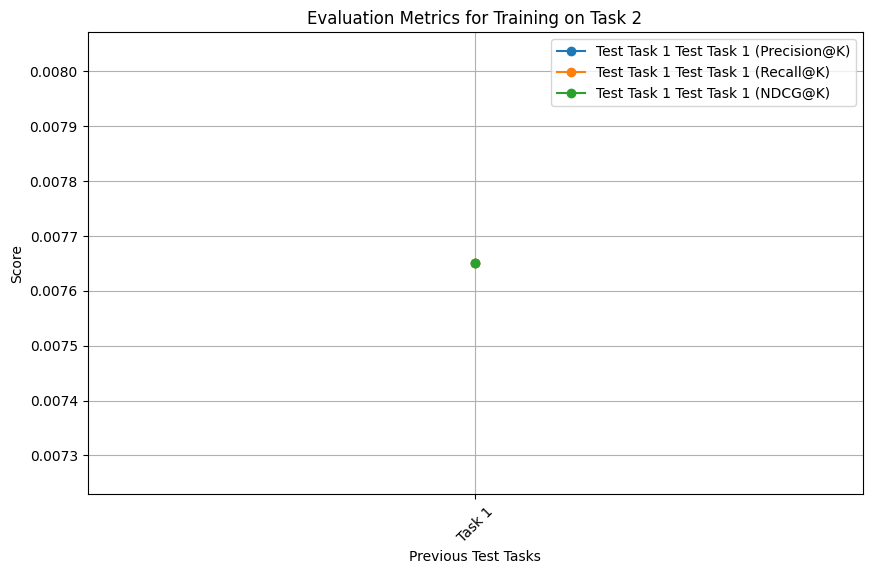

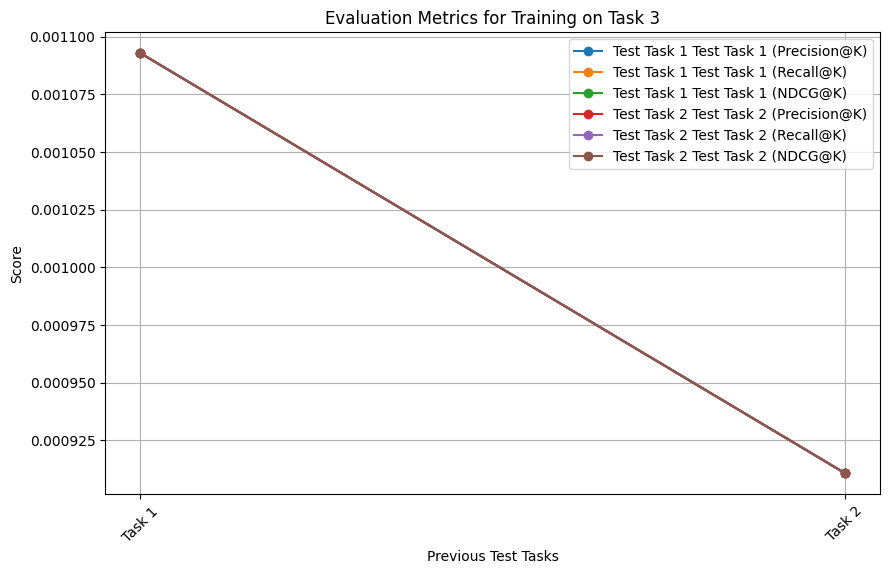

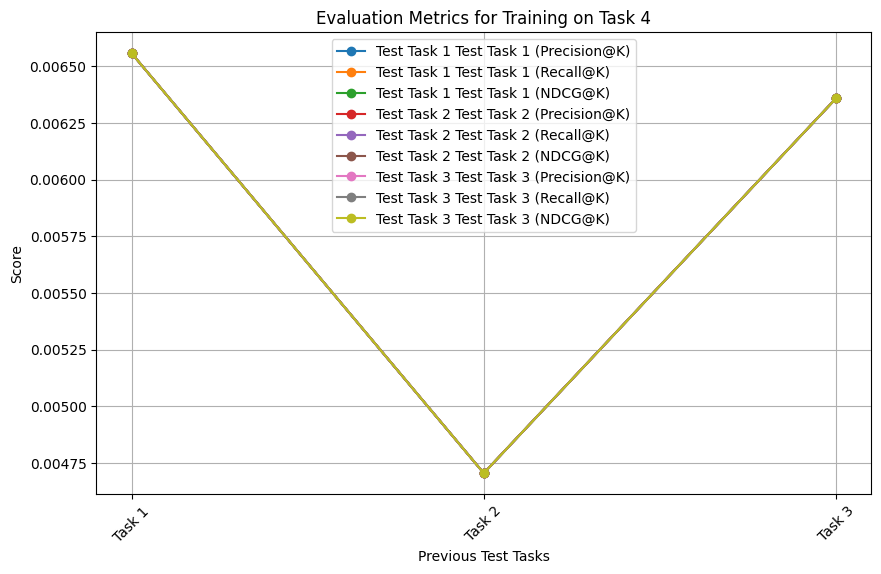

In [ ]:
import pandas as pd
import numpy as np
import pytorch_lightning as pl
from pytorch_lightning.callbacks import EarlyStopping
import matplotlib.pyplot as plt

# Assuming the MovieRecommender and UserMovieDataset are defined as per your previous code

def train_and_evaluate_lower_limit(task_data, num_movies, hidden_dims, k=5):
    # Initialize a DataFrame to hold results in lower triangular format
    results = pd.DataFrame(columns=['Training Task'])

    for task_id in range(len(task_data)):
        # Load training and validation data for the current task
        train_df = task_data[task_id]['train']
        val_df = task_data[task_id]['val']

        # Prepare data for model
        X_train, Y_train = prepare_data_for_model(train_df.drop(columns=['Y']), train_df['Y'], num_movies=num_movies)
        X_val, Y_val = prepare_data_for_model(val_df.drop(columns=['Y']), val_df['Y'], num_movies=num_movies)

        # Create data loaders
        train_loader = create_dataloaders(X_train, Y_train)
        val_loader = create_dataloaders(X_val, Y_val)

        # Initialize the model
        model = MovieRecommender(input_dim=X_train.shape[1], hidden_dims=hidden_dims, output_dim=num_movies)

        # Set up early stopping
        early_stopping = EarlyStopping(
            monitor="val_loss",
            patience=3,
            mode="min",
            verbose=True
        )

        # Train the model with early stopping
        trainer = pl.Trainer(max_epochs=100, accelerator="gpu" if torch.cuda.is_available() else "cpu", devices=1, callbacks=[early_stopping])
        trainer.fit(model, train_loader, val_loader)

        # Store metrics for the current task
        task_metrics = {
            'Training Task': f'Task {task_id + 1}',
        }

        # Evaluate the model on all previous test sets
        for prev_task_id in range(task_id + 1):
            if prev_task_id == task_id:  # Skip evaluation on the training task
                continue
            test_df = task_data[prev_task_id]['test']
            X_test, Y_test = prepare_data_for_model(test_df.drop(columns=['Y']), test_df['Y'], num_movies=num_movies)
            test_loader = create_dataloaders(X_test, Y_test)

            # Evaluate the model
            precision_at_k, recall_at_k, ndcg_at_k = evaluate_model(model, test_loader, Y_test, k)

            # Store results in a dictionary
            task_metrics[f'Test Task {prev_task_id + 1} (Precision@K)'] = precision_at_k
            task_metrics[f'Test Task {prev_task_id + 1} (Recall@K)'] = recall_at_k
            task_metrics[f'Test Task {prev_task_id + 1} (NDCG@K)'] = ndcg_at_k

        # Convert the metrics dictionary to DataFrame
        metrics_df = pd.DataFrame([task_metrics])

        # Concatenate the current metrics with the results DataFrame
        results = pd.concat([results, metrics_df], ignore_index=True)

    return results

# Usage example
num_movies = 1682  # Number of unique movies
hidden_dims = [128, 64, 32]  # Hidden layer sizes

# Assuming task_data is a list of dictionaries with 'train', 'val', and 'test' DataFrames
lower_limit_results = train_and_evaluate_lower_limit(task_data, num_movies, hidden_dims)

# Print the results
print(lower_limit_results)

# Generate separate line graphs for each training task's evaluation metrics starting from task 2
for task_id in range(1, len(lower_limit_results)):  # Start from Task 2
    task_metrics = lower_limit_results.iloc[task_id]
    plt.figure(figsize=(10, 6))

    # Extract the metrics for the current task
    metrics_labels = [col for col in task_metrics.index if 'Test Task' in col]
    metrics_values = task_metrics[metrics_labels].values

    # Plot metrics for the current training task against test tasks
    for i, metric in enumerate(metrics_values):
        if not pd.isna(metric):  # Ignore NaN values for plots
            plt.plot([f'Task {j+1}' for j in range(task_id)], metrics_values[:task_id], marker='o', label=f'Test Task {i//3 + 1} {metrics_labels[i]}')

    plt.title(f'Evaluation Metrics for Training on Task {task_id + 1}')
    plt.xlabel('Previous Test Tasks')
    plt.ylabel('Score')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid()
    plt.show()


In [ ]:
import pandas as pd
import numpy as np

# Sample data
data = {
    'Training Task': ['Task 1', 'Task 2', 'Task 3', 'Task 4'],
    'Test Task 1 (Precision@K)': [np.nan, 0.007650, 0.001093, 0.006557],
    'Test Task 1 (Recall@K)': [np.nan, 0.009706, 0.000911, 0.004706],
    'Test Task 1 (NDCG@K)': [np.nan, 0.009640, 0.000798, 0.006358],
    'Test Task 2 (Precision@K)': [np.nan, np.nan, 0.002899, 0.010145],
    'Test Task 2 (Recall@K)': [np.nan, np.nan, 0.001530, 0.008877],
    'Test Task 2 (NDCG@K)': [np.nan, np.nan, 0.003516, 0.010211],
    'Test Task 3 (Precision@K)': [np.nan, np.nan, np.nan, 0.006522],
    'Test Task 3 (Recall@K)': [np.nan, np.nan, np.nan, 0.003847],
    'Test Task 3 (NDCG@K)': [np.nan, np.nan, np.nan, 0.006956]
}

# Create DataFrame
df = pd.DataFrame(data)

# Define a function to create lower triangular tables for a specific metric
def create_lower_triangular_table(df, metric):
    # Extract relevant columns for the metric
    columns = [col for col in df.columns if metric in col]

    # Create a new DataFrame for the lower triangular representation
    lower_triangular = pd.DataFrame(index=df['Training Task'], columns=columns)

    # Fill the lower triangular part with the values from the original DataFrame
    for i in range(len(df)):
        for j in range(len(df)):
            if i >= j:  # Lower triangular condition
                lower_triangular.iloc[i, j] = df.iloc[i, df.columns.get_loc(columns[j])]

    # Replace NaN with empty strings for presentation
    lower_triangular = lower_triangular.fillna('')
    return lower_triangular

# Generate the lower triangular tables for each metric
precision_table = create_lower_triangular_table(df, 'Precision@K')
recall_table = create_lower_triangular_table(df, 'Recall@K')
ndcg_table = create_lower_triangular_table(df, 'NDCG@K')

# Display the results
print("Lower Triangular Table for Precision@K:")
print(precision_table.to_string(index=True))

print("\nLower Triangular Table for Recall@K:")
print(recall_table.to_string(index=True))

print("\nLower Triangular Table for NDCG@K:")
print(ndcg_table.to_string(index=True))


IndexError: list index out of range

In [ ]:
You have missed out giving the result for each task on its own test set. The diagonal values of the tables shouldnt be null. correct that.
Also dont include graph.
Modify the code

In [ ]:
Lower Triangular Table for Precision@K:
             Test Task 1 (Precision@K  Test Task 2 (Precision@K  Test Task 3 (Precision@K
Training Task
Task 1
Task 2                        0.00765
Task 3                        0.001093                 0.002899
Task 4                        0.006557                 0.010145                 0.006522

Lower Triangular Table for Recall@K:
             Test Task 1 (Recall@K  Test Task 2 (Recall@K  Test Task 3 (Recall@K
Training Task
Task 1
Task 2                        0.009706
Task 3                        0.000911                 0.001530
Task 4                        0.004706                 0.008877                 0.003847

Lower Triangular Table for NDCG@K:
             Test Task 1 (NDCG@K  Test Task 2 (NDCG@K  Test Task 3 (NDCG@K
Training Task
Task 1
Task 2                        0.00964
Task 3                        0.000798                 0.003516
Task 4                        0.006358                 0.010211                 0.006956


In [ ]:
import pandas as pd
import numpy as np
import pytorch_lightning as pl
from pytorch_lightning.callbacks import EarlyStopping

# Assuming the MovieRecommender and UserMovieDataset are defined as per your previous code

def train_and_evaluate_lower_limit(task_data, num_movies, hidden_dims, k=5):
    # Initialize a DataFrame to hold results in lower triangular format
    results = pd.DataFrame(columns=['Training Task'])

    for task_id in range(len(task_data)):
        # Load training and validation data for the current task
        train_df = task_data[task_id]['train']
        val_df = task_data[task_id]['val']
        test_df = task_data[task_id]['test']  # Also load test data for the current task

        # Prepare data for model
        X_train, Y_train = prepare_data_for_model(train_df.drop(columns=['Y']), train_df['Y'], num_movies=num_movies)
        X_val, Y_val = prepare_data_for_model(val_df.drop(columns=['Y']), val_df['Y'], num_movies=num_movies)
        X_test, Y_test = prepare_data_for_model(test_df.drop(columns=['Y']), test_df['Y'], num_movies=num_movies)  # Prepare test data

        # Create data loaders
        train_loader = create_dataloaders(X_train, Y_train)
        val_loader = create_dataloaders(X_val, Y_val)

        # Initialize the model
        model = MovieRecommender(input_dim=X_train.shape[1], hidden_dims=hidden_dims, output_dim=num_movies)

        # Set up early stopping
        early_stopping = EarlyStopping(
            monitor="val_loss",
            patience=3,
            mode="min",
            verbose=True
        )

        # Train the model with early stopping
        trainer = pl.Trainer(max_epochs=100, accelerator="gpu" if torch.cuda.is_available() else "cpu", devices=1, callbacks=[early_stopping])
        trainer.fit(model, train_loader, val_loader)

        # Store metrics for the current task
        task_metrics = {
            'Training Task': f'Task {task_id + 1}',
        }

        # Evaluate the model on its own test set (diagonal value)
        precision_at_k, recall_at_k, ndcg_at_k = evaluate_model(model, create_dataloaders(X_test, Y_test), Y_test, k)
        task_metrics[f'Test Task {task_id + 1} (Precision@K)'] = precision_at_k
        task_metrics[f'Test Task {task_id + 1} (Recall@K)'] = recall_at_k
        task_metrics[f'Test Task {task_id + 1} (NDCG@K)'] = ndcg_at_k

        # Evaluate the model on all previous test sets
        for prev_task_id in range(task_id):
            test_df = task_data[prev_task_id]['test']
            X_test, Y_test = prepare_data_for_model(test_df.drop(columns=['Y']), test_df['Y'], num_movies=num_movies)
            test_loader = create_dataloaders(X_test, Y_test)

            # Evaluate the model
            precision_at_k, recall_at_k, ndcg_at_k = evaluate_model(model, test_loader, Y_test, k)

            # Store results in a dictionary
            task_metrics[f'Test Task {prev_task_id + 1} (Precision@K)'] = precision_at_k
            task_metrics[f'Test Task {prev_task_id + 1} (Recall@K)'] = recall_at_k
            task_metrics[f'Test Task {prev_task_id + 1} (NDCG@K)'] = ndcg_at_k

        # Convert the metrics dictionary to DataFrame
        metrics_df = pd.DataFrame([task_metrics])

        # Concatenate the current metrics with the results DataFrame
        results = pd.concat([results, metrics_df], ignore_index=True)

    return results

# Usage example
num_movies = 1682  # Number of unique movies
hidden_dims = [128, 64, 32]  # Hidden layer sizes

# Assuming task_data is a list of dictionaries with 'train', 'val', and 'test' DataFrames
lower_limit_results = train_and_evaluate_lower_limit(task_data, num_movies, hidden_dims)

# Print the results
print(lower_limit_results)


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type       | Params | Mode 
---------------------------------------------
0 | model | Sequential | 71.7 K | train
---------------------------------------------
71.7 K    Trainable params
0         Non-trainable params
71.7 K    Total params
0.287     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Initial - (546, 51)
After converting boolean columns - (546, 51)
After scaling - (546, 51)
After encoding - (546, 46)
After removing user_id - (546, 45)
Final - (546, 45)
Initial - (182, 51)
After converting boolean columns - (182, 51)
After scaling - (182, 51)
After encoding - (182, 46)
After removing user_id - (182, 45)
Final - (182, 45)
Initial - (183, 51)
After converting boolean columns - (183, 51)
After scaling - (183, 51)
After encoding - (183, 46)
After removing user_id - (183, 45)
Final - (183, 45)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:475: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (18) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 32.554


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 12.463 >= min_delta = 0.0. New best score: 20.091


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 10.070 >= min_delta = 0.0. New best score: 10.021


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 5.497 >= min_delta = 0.0. New best score: 4.524


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 2.015 >= min_delta = 0.0. New best score: 2.509


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 1.207 >= min_delta = 0.0. New best score: 1.302


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.876 >= min_delta = 0.0. New best score: 0.426


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.178 >= min_delta = 0.0. New best score: 0.248


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.046 >= min_delta = 0.0. New best score: 0.202


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.201


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.012 >= min_delta = 0.0. New best score: 0.188


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.013 >= min_delta = 0.0. New best score: 0.176


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.173


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.170


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 3 records. Best score: 0.170. Signaling Trainer to stop.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type       | Params | Mode 
---------------------------------------------
0 | model | Sequential | 71.7 K | train
---------------------------------------------
71.7 K    Trainable params
0         Non-trainable params
71.7 K    Total params
0.287     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Initial - (412, 51)
After converting boolean columns - (412, 51)
After scaling - (412, 51)
After encoding - (412, 46)
After removing user_id - (412, 45)
Final - (412, 45)
Initial - (138, 51)
After converting boolean columns - (138, 51)
After scaling - (138, 51)
After encoding - (138, 46)
After removing user_id - (138, 45)
Final - (138, 45)
Initial - (138, 51)
After converting boolean columns - (138, 51)
After scaling - (138, 51)
After encoding - (138, 46)
After removing user_id - (138, 45)
Final - (138, 45)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:475: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (13) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 33.764


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 10.035 >= min_delta = 0.0. New best score: 23.730


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 8.574 >= min_delta = 0.0. New best score: 15.156


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 6.179 >= min_delta = 0.0. New best score: 8.977


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 3.295 >= min_delta = 0.0. New best score: 5.682


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 2.458 >= min_delta = 0.0. New best score: 3.223


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.992 >= min_delta = 0.0. New best score: 2.231


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.869 >= min_delta = 0.0. New best score: 1.362


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.705 >= min_delta = 0.0. New best score: 0.657


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.139 >= min_delta = 0.0. New best score: 0.518


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.160 >= min_delta = 0.0. New best score: 0.357


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.092 >= min_delta = 0.0. New best score: 0.266


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.022 >= min_delta = 0.0. New best score: 0.243


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.050 >= min_delta = 0.0. New best score: 0.194


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.183


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.178


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.173


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.167


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.162


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 0.153


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.146


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 3 records. Best score: 0.146. Signaling Trainer to stop.


Initial - (183, 51)
After converting boolean columns - (183, 51)
After scaling - (183, 51)
After encoding - (183, 46)
After removing user_id - (183, 45)
Final - (183, 45)
Initial - (275, 51)
After converting boolean columns - (275, 51)
After scaling - (275, 51)
After encoding - (275, 46)
After removing user_id - (275, 45)
Final - (275, 45)
Initial - (92, 51)
After converting boolean columns - (92, 51)
After scaling - (92, 51)
After encoding - (92, 46)
After removing user_id - (92, 45)
Final - (92, 45)
Initial - (92, 51)
After converting boolean columns - (92, 51)
After scaling - (92, 51)
After encoding - (92, 46)
After removing user_id - (92, 45)
Final - (92, 45)


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type       | Params | Mode 
---------------------------------------------
0 | model | Sequential | 71.7 K | train
---------------------------------------------
71.7 K    Trainable params
0         Non-trainable params
71.7 K    Total params
0.287     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:475: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (9) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 34.416


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 11.236 >= min_delta = 0.0. New best score: 23.180


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 22.495 >= min_delta = 0.0. New best score: 0.685


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.681


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.675


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.670


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.665


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.660


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.655


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.651


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.646


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 0.641


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.637


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.633


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.628


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.624


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.620


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.616


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.611


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.607


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.603


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.599


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.595


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.591


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.587


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.583


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.580


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.576


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.572


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.568


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.565


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.561


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.557


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.554


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.550


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.546


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.543


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.539


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.536


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.532


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.529


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.526


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.522


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.519


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.516


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.512


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.509


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.506


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.503


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.499


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.496


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.493


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.490


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.487


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.484


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.481


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.478


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.475


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.472


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.469


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.466


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.463


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.460


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.457


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.454


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.451


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.449


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.446


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.443


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.440


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.438


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.435


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.432


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.430


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.427


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.424


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.422


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.419


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.417


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.414


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.412


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.409


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.407


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.404


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.402


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.399


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.397


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.394


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.392


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.390


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.387


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.385


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.383


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.380


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.378


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.376


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.374


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.371


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.369


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.367
INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


Initial - (183, 51)
After converting boolean columns - (183, 51)
After scaling - (183, 51)
After encoding - (183, 46)
After removing user_id - (183, 45)
Final - (183, 45)
Initial - (138, 51)
After converting boolean columns - (138, 51)
After scaling - (138, 51)
After encoding - (138, 46)
After removing user_id - (138, 45)
Final - (138, 45)


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type       | Params | Mode 
---------------------------------------------
0 | model | Sequential | 71.7 K | train
---------------------------------------------
71.7 K    Trainable params
0         Non-trainable params
71.7 K    Total params
0.287     Total estimated model params size (MB)
8         Modules in train mode
0         Modules in eval mode


Initial - (138, 51)
After converting boolean columns - (138, 51)
After scaling - (138, 51)
After encoding - (138, 46)
After removing user_id - (138, 45)
Final - (138, 45)
Initial - (46, 51)
After converting boolean columns - (46, 51)
After scaling - (46, 51)
After encoding - (46, 46)
After removing user_id - (46, 45)
Final - (46, 45)
Initial - (46, 51)
After converting boolean columns - (46, 51)
After scaling - (46, 51)
After encoding - (46, 46)
After removing user_id - (46, 45)
Final - (46, 45)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:475: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test dataloaders.
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (5) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 42.204


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 4.517 >= min_delta = 0.0. New best score: 37.688


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 5.283 >= min_delta = 0.0. New best score: 32.405


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 3.254 >= min_delta = 0.0. New best score: 29.152


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 3.884 >= min_delta = 0.0. New best score: 25.268


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 3.361 >= min_delta = 0.0. New best score: 21.907


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 2.918 >= min_delta = 0.0. New best score: 18.989


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 2.198 >= min_delta = 0.0. New best score: 16.790


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 1.198 >= min_delta = 0.0. New best score: 15.592


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.797 >= min_delta = 0.0. New best score: 14.795


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.788 >= min_delta = 0.0. New best score: 14.007


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.545 >= min_delta = 0.0. New best score: 13.462


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.372 >= min_delta = 0.0. New best score: 13.090


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.375 >= min_delta = 0.0. New best score: 12.714


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.349 >= min_delta = 0.0. New best score: 12.365


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.163 >= min_delta = 0.0. New best score: 12.203


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.221 >= min_delta = 0.0. New best score: 11.981


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.265 >= min_delta = 0.0. New best score: 11.716


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.112 >= min_delta = 0.0. New best score: 11.604


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.037 >= min_delta = 0.0. New best score: 11.567


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.196 >= min_delta = 0.0. New best score: 11.371


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.017 >= min_delta = 0.0. New best score: 11.354


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.130 >= min_delta = 0.0. New best score: 11.223


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.439 >= min_delta = 0.0. New best score: 10.784


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.135 >= min_delta = 0.0. New best score: 10.650


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.185 >= min_delta = 0.0. New best score: 10.465


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.087 >= min_delta = 0.0. New best score: 10.378


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.331 >= min_delta = 0.0. New best score: 10.047


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.090 >= min_delta = 0.0. New best score: 9.957


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.094 >= min_delta = 0.0. New best score: 9.863


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.206 >= min_delta = 0.0. New best score: 9.657


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.394 >= min_delta = 0.0. New best score: 9.263


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.051 >= min_delta = 0.0. New best score: 9.212


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.016 >= min_delta = 0.0. New best score: 9.196


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.135 >= min_delta = 0.0. New best score: 9.061


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.468 >= min_delta = 0.0. New best score: 8.593


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.143 >= min_delta = 0.0. New best score: 8.450


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.117 >= min_delta = 0.0. New best score: 8.333


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.011 >= min_delta = 0.0. New best score: 8.322


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.116 >= min_delta = 0.0. New best score: 8.206


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.114 >= min_delta = 0.0. New best score: 8.091


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.058 >= min_delta = 0.0. New best score: 8.033


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.060 >= min_delta = 0.0. New best score: 7.974


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.052 >= min_delta = 0.0. New best score: 7.921


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 7.914


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.114 >= min_delta = 0.0. New best score: 7.801


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.058 >= min_delta = 0.0. New best score: 7.742


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.060 >= min_delta = 0.0. New best score: 7.682


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.062 >= min_delta = 0.0. New best score: 7.620


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.064 >= min_delta = 0.0. New best score: 7.556


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.171 >= min_delta = 0.0. New best score: 7.385


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.018 >= min_delta = 0.0. New best score: 7.367


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.106 >= min_delta = 0.0. New best score: 7.261


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.082 >= min_delta = 0.0. New best score: 7.179


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.084 >= min_delta = 0.0. New best score: 7.095


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 3 records. Best score: 7.095. Signaling Trainer to stop.


Initial - (183, 51)
After converting boolean columns - (183, 51)
After scaling - (183, 51)
After encoding - (183, 46)
After removing user_id - (183, 45)
Final - (183, 45)
Initial - (138, 51)
After converting boolean columns - (138, 51)
After scaling - (138, 51)
After encoding - (138, 46)
After removing user_id - (138, 45)
Final - (138, 45)
Initial - (92, 51)
After converting boolean columns - (92, 51)
After scaling - (92, 51)
After encoding - (92, 46)
After removing user_id - (92, 45)
Final - (92, 45)
  Training Task  Test Task 1 (Precision@K)  Test Task 1 (Recall@K)  \
0        Task 1                   0.008743                0.006319   
1        Task 2                   0.003279                0.002693   
2        Task 3                   0.001093                0.001093   
3        Task 4                   0.004372                0.002830   

   Test Task 1 (NDCG@K)  Test Task 2 (Precision@K)  Test Task 2 (Recall@K)  \
0              0.009679                        NaN              

In [ ]:
upper_limit_results.head()

,Task ID,Precision@K,Recall@K,NDCG@K
0,1,0.026230,0.019774,0.019640
1,2,0.011594,0.010956,0.008917
2,3,0.006522,0.005918,0.005981
3,4,0.017391,0.017935,0.015037


In [ ]:
lower_limit_results.head()

,Training Task,Test Task 1 (Precision@K),Test Task 1 (Recall@K),Test Task 1 (NDCG@K),Test Task 2 (Precision@K),Test Task 2 (Recall@K),Test Task 2 (NDCG@K),Test Task 3 (Precision@K),Test Task 3 (Recall@K),Test Task 3 (NDCG@K),Test Task 4 (Precision@K),Test Task 4 (Recall@K),Test Task 4 (NDCG@K)
0,Task 1,0.008743,0.006319,0.009679,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Task 2,0.003279,0.002693,0.004704,0.020290,0.016534,0.022030,NaN,NaN,NaN,NaN,NaN,NaN
2,Task 3,0.001093,0.001093,0.000798,0.002899,0.001932,0.002458,0.0,0.0,0.0,NaN,NaN,NaN
3,Task 4,0.004372,0.002830,0.004376,0.010145,0.009691,0.012054,0.0,0.0,0.0,0.013043,0.010326,0.009683
